In [1]:
import pandas as pd, numpy as np, math, glob, os, cv2, matplotlib.pyplot as plt
import csv, cv2, numpy as np, pandas as pd, matplotlib.pyplot as plt, string, PIL, keras, pymysql
from sklearn.feature_extraction.image import extract_patches_2d
import collections, time, pickle, glob, os, cv2, os.path, math
from keras.models import load_model,model_from_json
from collections import OrderedDict, Counter
from skimage.transform import resize
from sklearn.externals import joblib
from sklearn import preprocessing
from skimage.feature import hog
from fuzzywuzzy import process
from scipy.stats import boxcox
from PIL import ImageEnhance
from fuzzywuzzy import fuzz
from pandasql import sqldf
from scipy import ndimage
from PIL import Image
from os import walk
#import MySQLdb
import fuzzywuzzy
import warnings
warnings.filterwarnings('ignore')

/root/anaconda3/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


In [2]:
df = pd.read_excel('/home/Sandeep/Bagic_field_dimensions.xlsx')
df.head()

,FieldName,Type,GridWidth,Step,Noofgridlines,ImageTested,Erosion,Dilation,Unnamed: 8
0,UID,Numeric,7,59,13,Yes,"(3,1)","(3,1)",NaN
1,Pincode,Numeric,7,59,7,Yes,"(3,1)","(3,1)",NaN
2,Mobile Number,Numeric,7,59,11,Yes,"(3,1)","(3,1)",NaN
3,Period of Insurance From,Numeric,7,59,9,Yes,"(3,1)","(3,1)",NaN
4,Period of Insurance To,Numeric,7,59,9,Yes,"(3,1)","(3,1)",NaN


In [3]:
#df.loc[df['FieldName']=='First name']['Erosion']
df.loc[df['FieldName']=='pincode']['Step'].astype(int)

Series([], Name: Step, dtype: int64)

In [4]:
for image_path in glob.glob(os.path.join('/KALpydev/new_Cropped/','*/*/*.jpg')):
    #img = cv2.imread(image_path,0)
        fname=image_path.split('/')[5].split('.')[0]
        for i in df['FieldName']:
            if i==fname:
                print(fname,df.loc[df['FieldName']==fname]['Step'].astype(int))
            else:
                pass

UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int6

If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile N

Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, d

Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dty

In [5]:
for image_path in glob.glob(os.path.join('/KALpydev/new_Cropped/','*/*/*.jpg')):
    #img = cv2.imread(image_path,0)
        fname=image_path.split('/')[5].split('.')[0]
        for fname in df['FieldName']:
            print(fname,df.loc[df['FieldName']==fname]['Step'])

UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int6

Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31 

UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int6

Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, d

Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: i

Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int6

Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step,

Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, d

Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dty

Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, 

Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dty

Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance

Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int6

Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis

Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype:

Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dty

Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of t

Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step

NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period o

UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int6

If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile N

Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype:

Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, d

State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Na

Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int6

Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of t

Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype:

Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, d

First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
N

Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: i

Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64

Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance

Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int6

If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile N

Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64

Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, d

City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dt

Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname

If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile N

Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int

Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: St

Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11

Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB E

Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64

Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype:

Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23 

Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0  

Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype:

Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dty

Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype:

Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: i

Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading

Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23 

City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dt

Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis

Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int

Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23 

Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, d

Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: i

Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int6

Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step,

Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capaci

Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis

City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dt

Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23 

First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
N

Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dty

If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile N

Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    5

Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dty

Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype:

Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step

Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: i

City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dt

Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dty

Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dt

Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int6

Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis

Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB E

Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis

Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype:

Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step,

Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of t

City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dt

Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int6

Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23 

Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step,

Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which

Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dty

Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance

Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int

Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dty

Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8  

Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dty

Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: i

Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int6

Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which

Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int6

Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: i

Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype:

Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, d

State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Na

Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step,

Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: St

First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
N

Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dty

Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which

Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int6

Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dt

Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step

Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of t

Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading

Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23 

Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance

Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype:

Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step

Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: in

Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading

State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Na

Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis

Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which

Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64

Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine

State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Na

Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, d

Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year

Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8  

Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    5

Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, d

Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: i

Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64

Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, d

Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB E

Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis

Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12

Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis

Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: i

State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Na

Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    5

Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31 

State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Na

Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23 

Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype

Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int6

If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile N

Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int6

If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile N

Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int6

Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance

State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Na

Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, d

State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Na

Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dty

Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dt

Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis

Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: i

Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31 

Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB E

Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis

Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int6

Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: St

Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64

Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which

Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step,

State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Na

Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Ste

Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB E

Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31 

Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int

If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile N

Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int6

Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23 

Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis

Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype:

Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Ste

Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype:

Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis

Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB E

Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: 

State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Na

Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step,

Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step

Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which

Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dty

First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
N

Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64


Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5  

City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dt

Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step,

Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading

If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile N

Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int6

Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which

Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dty

First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
N

Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dty

Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which

First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
N

Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading

Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int6

Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dty

Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, d

NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period o

Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype:

Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, d

City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dt

Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64


Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: in

Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step

Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year

Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int6

Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31 

Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capaci

Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int6

Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8  

Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64

Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23 

First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
N

Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step

First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
N

Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dty

Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: i

Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name

Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of t

Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int6

City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dt

Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dty

Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: i

Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dty

Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: i

Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int6

Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis

Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31 

Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name:

Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int6

Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of t

Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    5

Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: i

Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step

Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis

City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dt

Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int6

Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23 

Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dt

Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dty

Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23 

Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31 

First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
N

Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int6

Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis

Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31 

Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of t

Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dty

Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which

Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23 

Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64
UID 0    59
Name: Step, dtype: int64
Pincode 1    59
Name: Step, dtype: int64
Mobile Number 2    59
Name: Step, dtype: int64
Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: in

Period of Insurance From 3    59
Name: Step, dtype: int64
Period of Insurance To 4    59
Name: Step, dtype: int64
Age at which you got the licence 5    59
Name: Step, dtype: int64
Date Of Registration 6    59
Name: Step, dtype: int64
Year Of Manufacture 7    59
Name: Step, dtype: int64
Date of purchase of the Vehicle by you 8    59
Name: Step, dtype: int64
Cubic Capacity 9    53
Name: Step, dtype: int64
Seating Capacity 10    53
Name: Step, dtype: int64
Kilometer reading as on date 11    53
Name: Step, dtype: int64
Loan Account Number 12    59
Name: Step, dtype: int64
If Yes Number Of Claims 13    59
Name: Step, dtype: int64
Claim Amount 14    59
Name: Step, dtype: int64
NCB Earned On Last Policy 15    59
Name: Step, dtype: int64
Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dty

Age Of Nominee 16    59
Name: Step, dtype: int64
Cheque Number 17    53
Name: Step, dtype: int64
Title 18    59
Name: Step, dtype: int64
First name 19    59
Name: Step, dtype: int64
Middle Name 20    59
Name: Step, dtype: int64
Surname 21    59
Name: Step, dtype: int64
City 22    59
Name: Step, dtype: int64
State 23    59
Name: Step, dtype: int64
Make 24    53
Name: Step, dtype: int64
Name of the Nominee 25    59
Name: Step, dtype: int64
Relationship of the Nominee 26    59
Name: Step, dtype: int64
Name and designation 27    59
Name: Step, dtype: int64
Registration Number 28    59
Name: Step, dtype: int64
Engine Number 29    53
Name: Step, dtype: int64
Chasis Number 30    53
Name: Step, dtype: int64
Model 31    53
Name: Step, dtype: int64


89367116
Numeric
Scrutiny Number


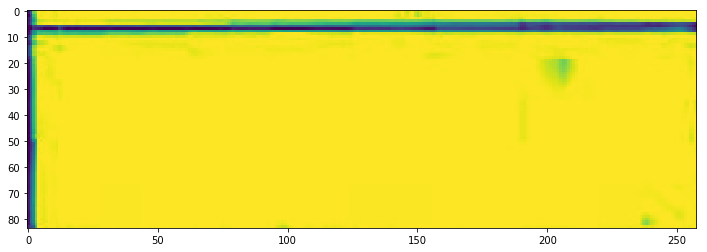

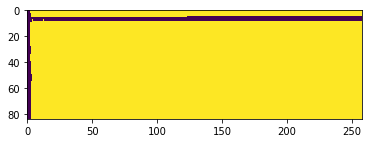

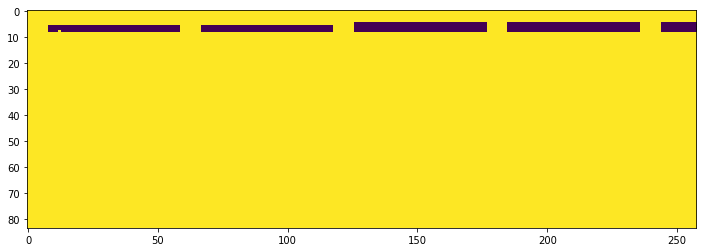

89367116
Numeric
Receipt Number


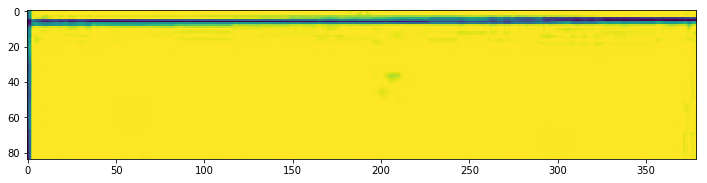

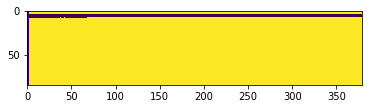

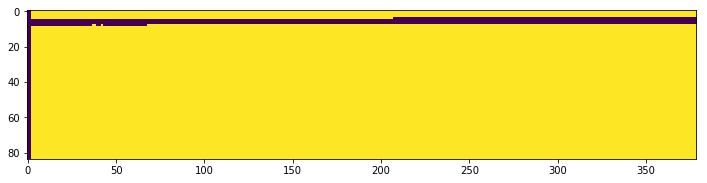

89367116
Numeric
Policy Number


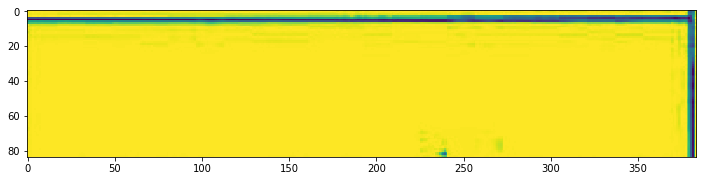

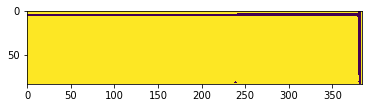

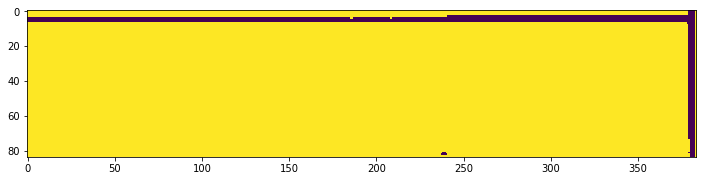

89367116
Numeric
IMD Code


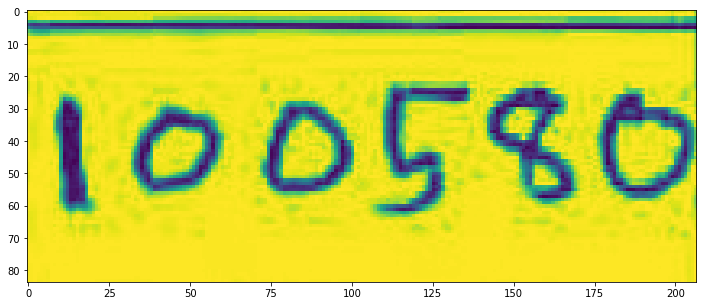

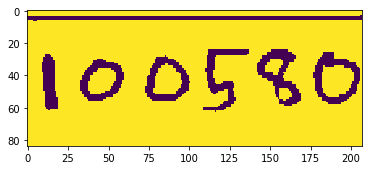

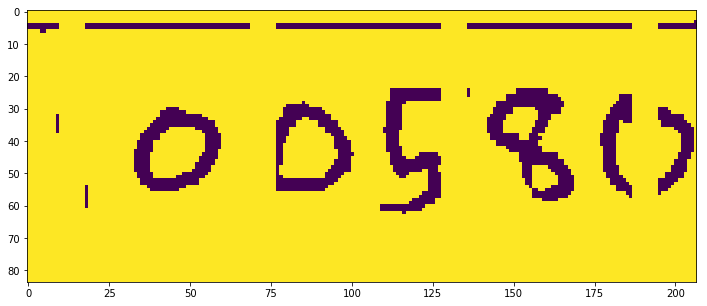

89367116
Numeric
Sub IMD Code


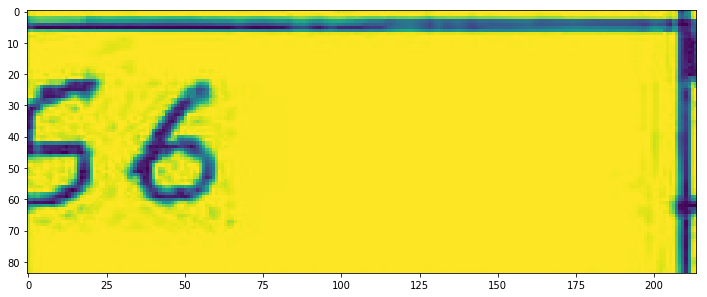

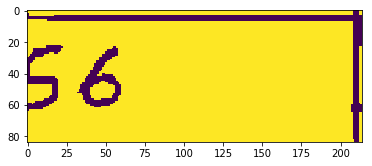

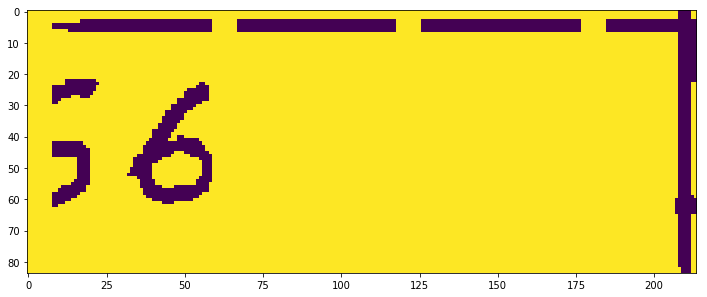

89367116
Numeric
Mobile Number_T


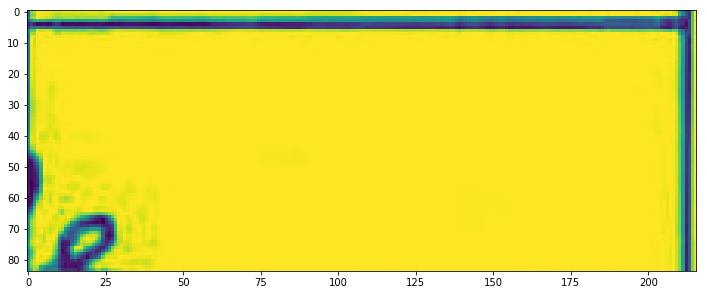

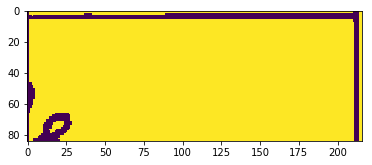

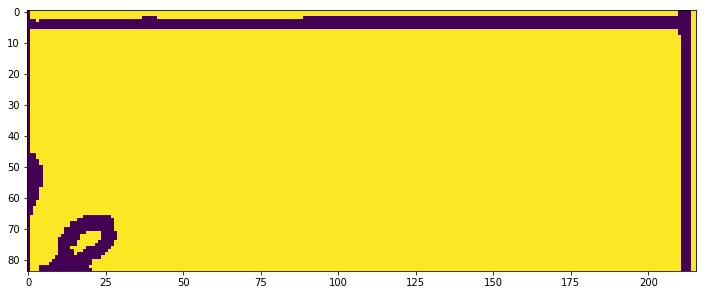

89367116
Numeric
Emp Code


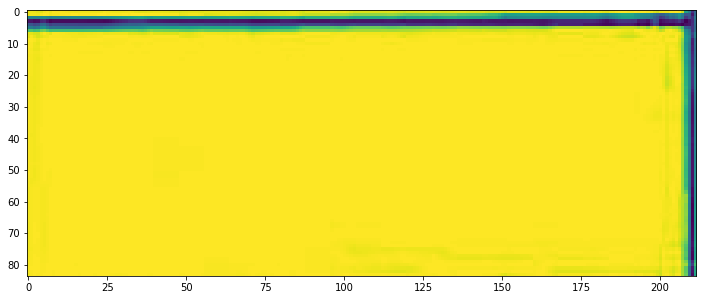

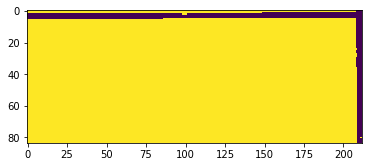

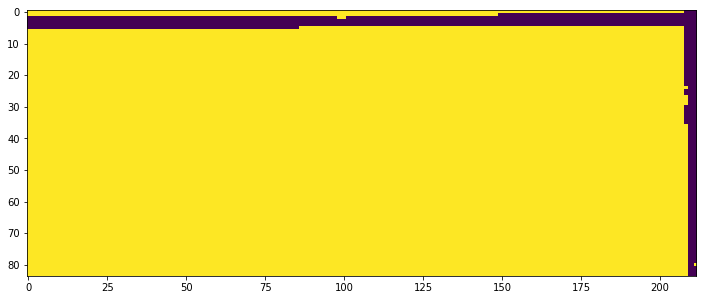

89367116
Numeric
Date Of Birth


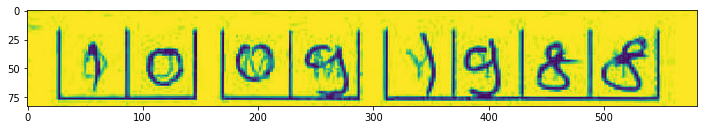

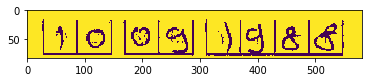

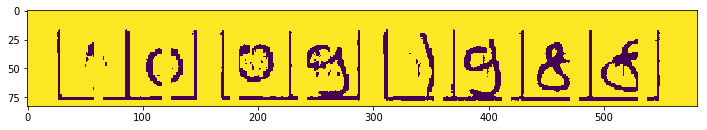

89367116
Numeric
UID


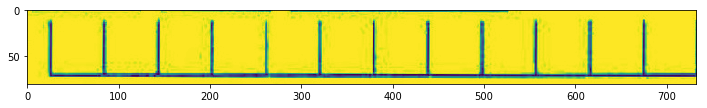

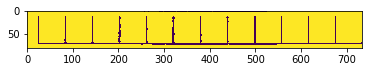

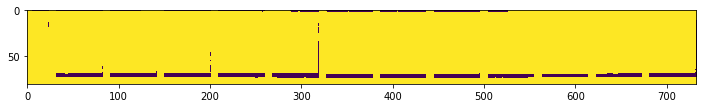

89367116
Numeric
Pincode


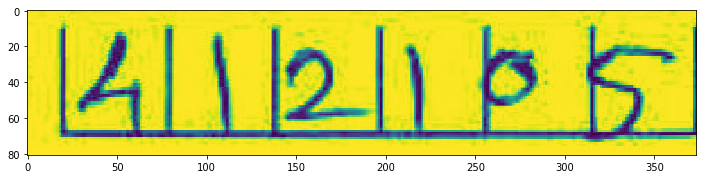

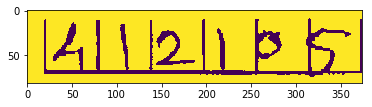

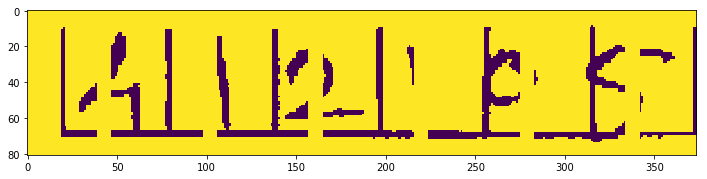

89367116
Numeric
Telephone_Res


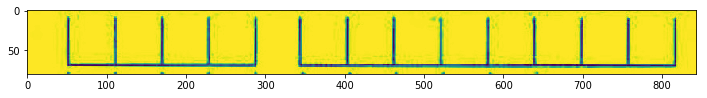

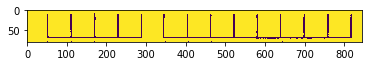

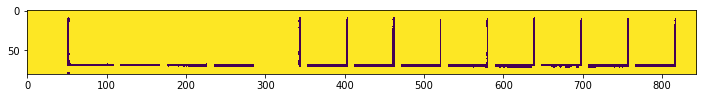

89367116
Numeric
Telephone_Office


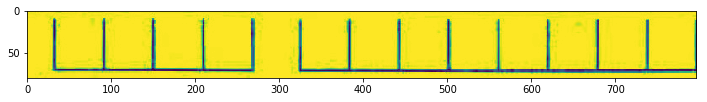

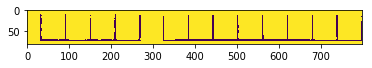

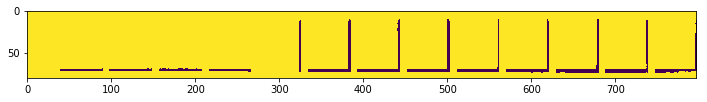

89367116
Numeric
Mobile Number


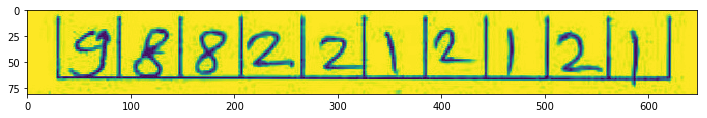

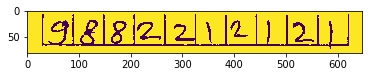

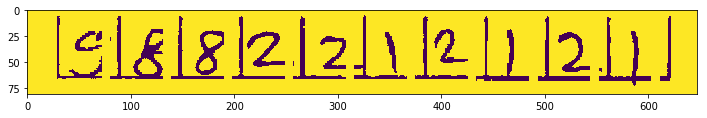

89367116
Numeric
Period of Insurance From


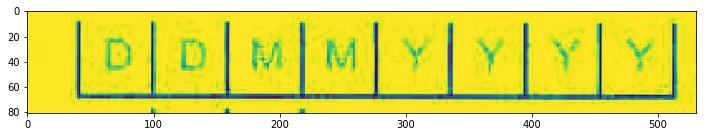

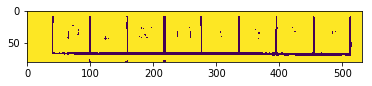

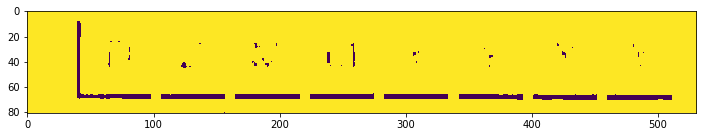

89367116
Numeric
Period of Insurance To


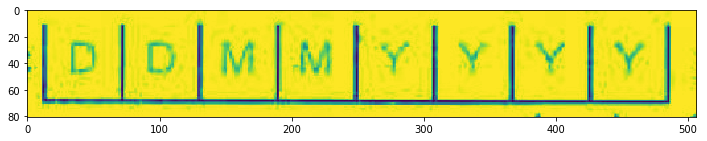

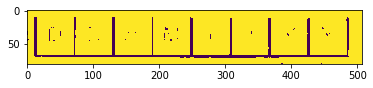

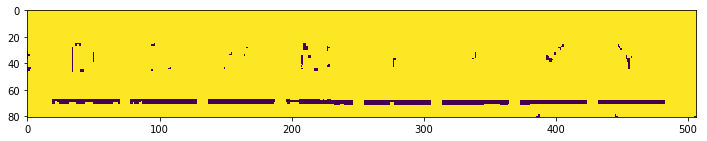

89367116
Numeric
Age at which you got the licence


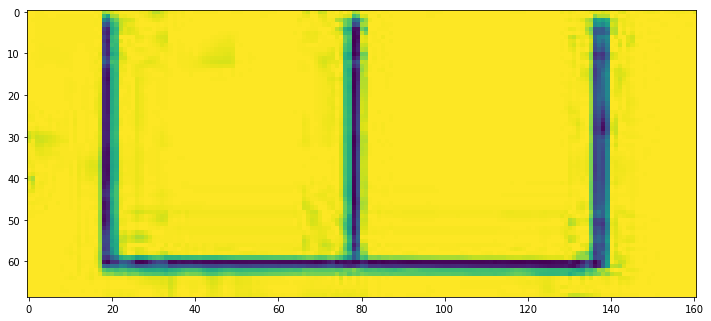

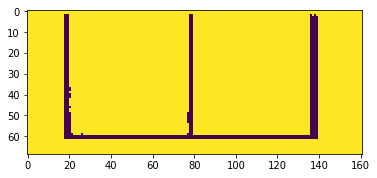

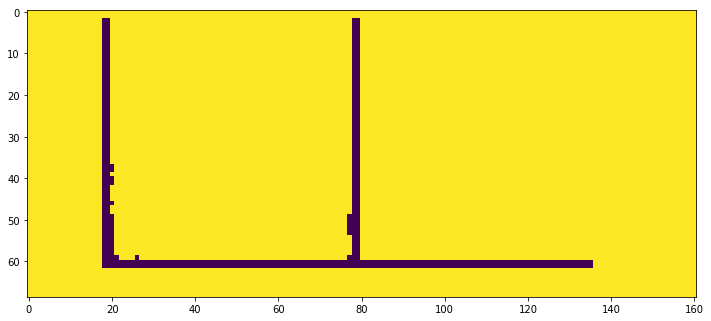

89367116
Numeric
Date Of Registration


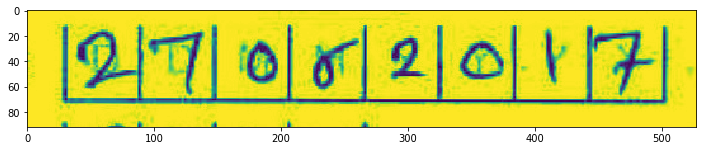

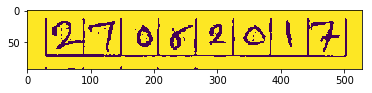

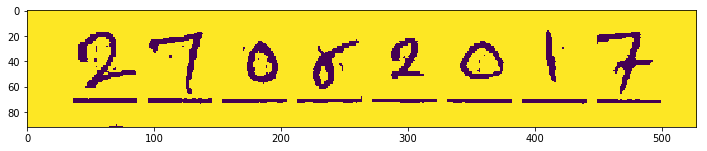

89367116
Numeric
Year Of Manufacture


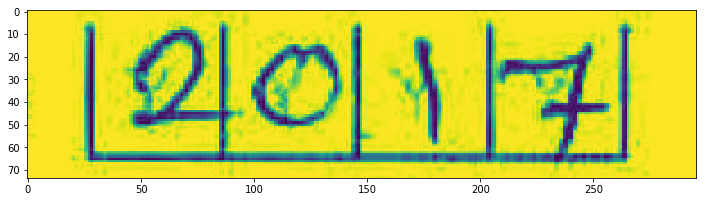

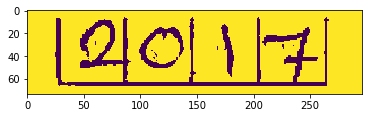

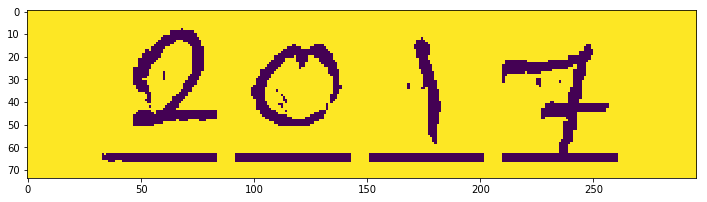

89367116
Numeric
Date of purchase of the Vehicle by you


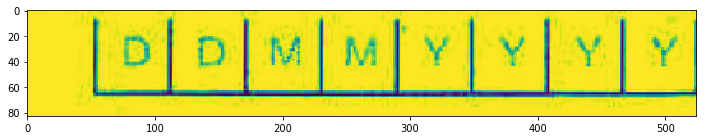

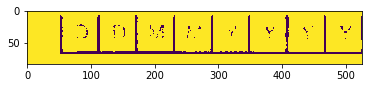

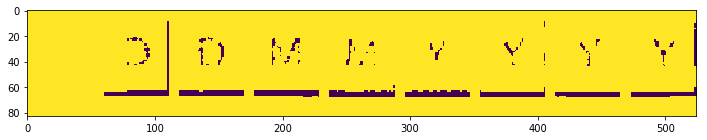

89367116
Numeric
Cubic Capacity


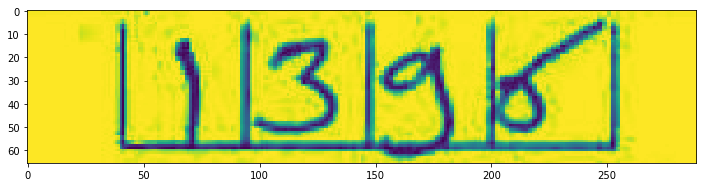

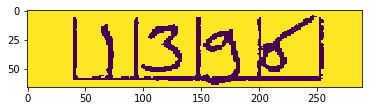

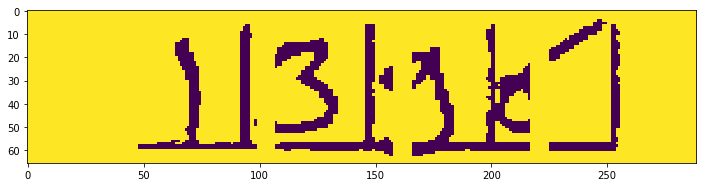

89367116
Numeric
Seating Capacity


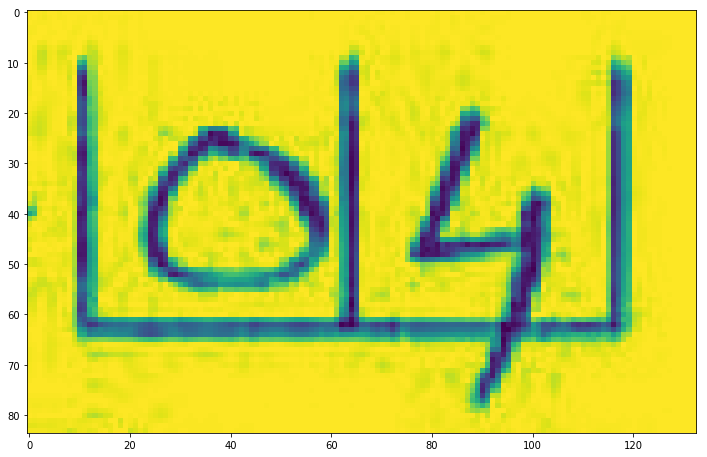

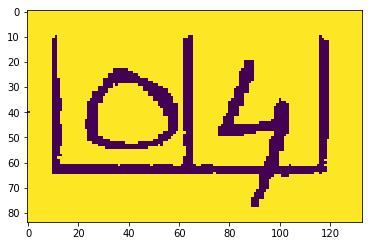

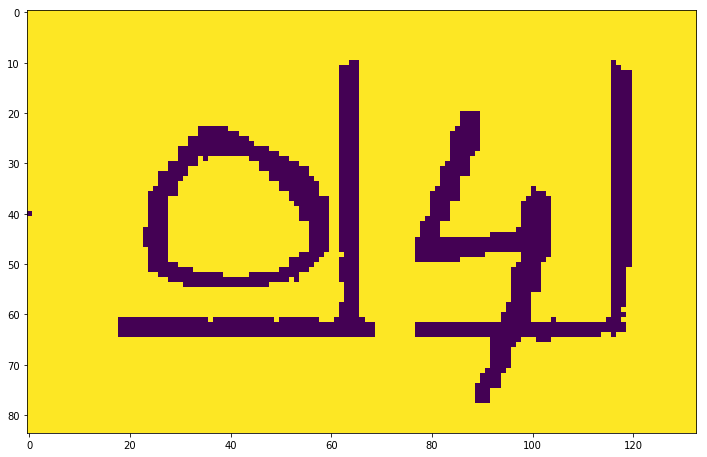

89367116
Numeric
Kilometer reading as on date


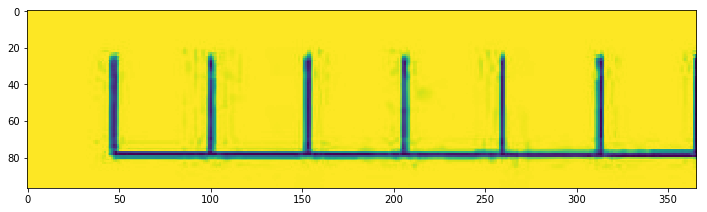

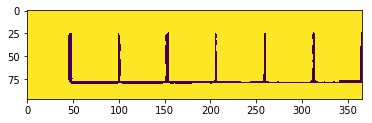

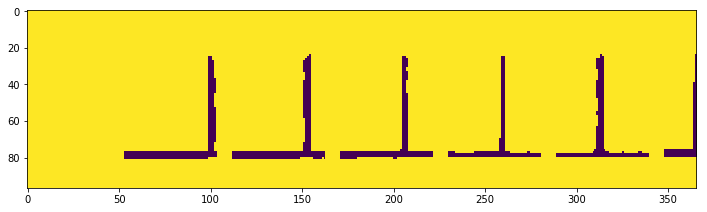

89367116
Numeric
Loan Account Number


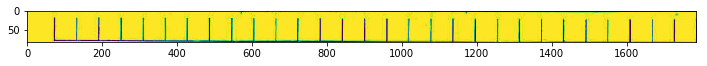

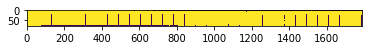

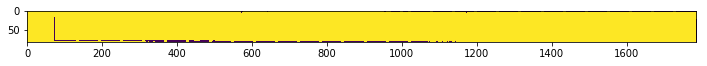

89367116
Numeric
If Yes Number Of Claims


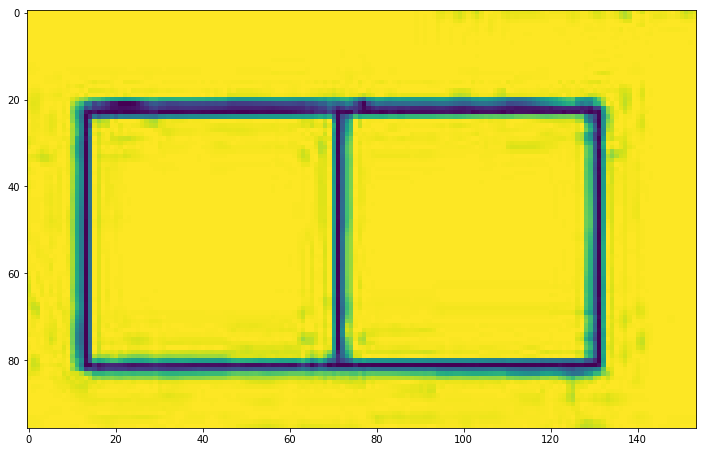

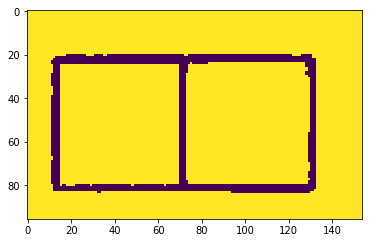

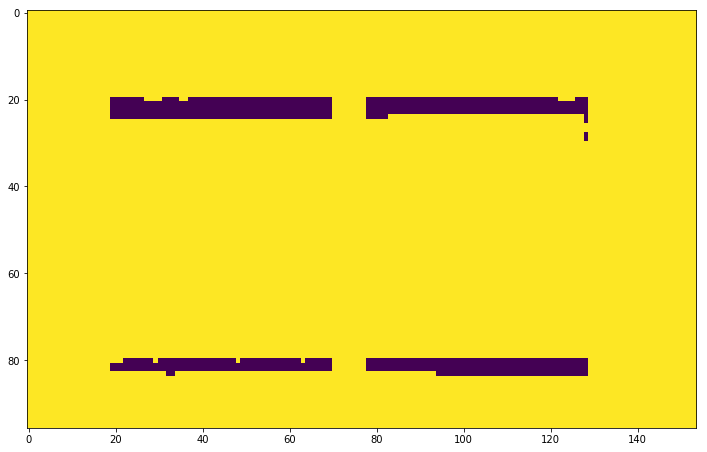

89367116
Numeric
Claim Amount


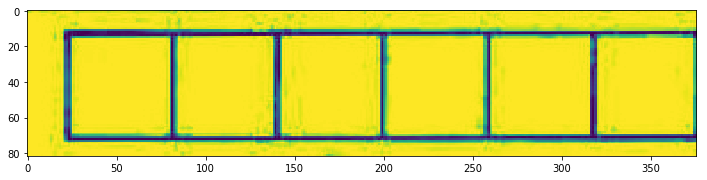

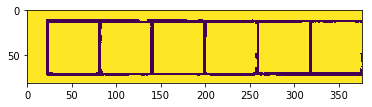

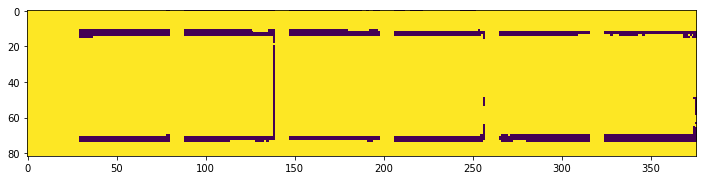

89367116
Numeric
NCB Earned On Last Policy


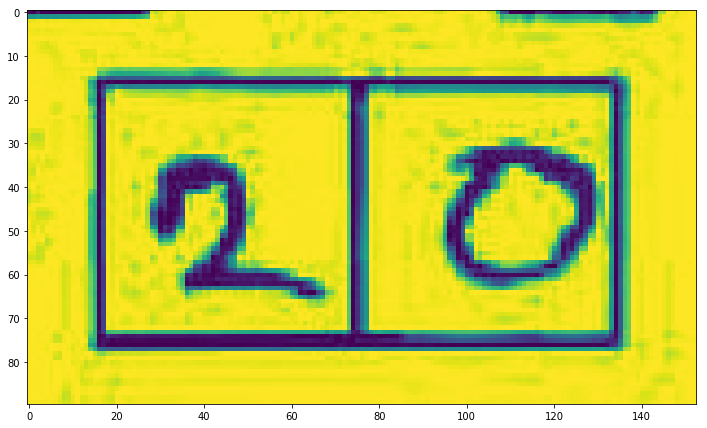

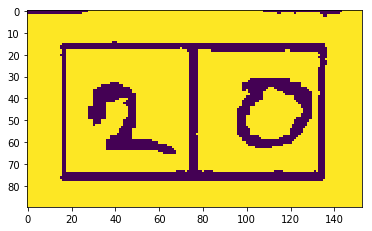

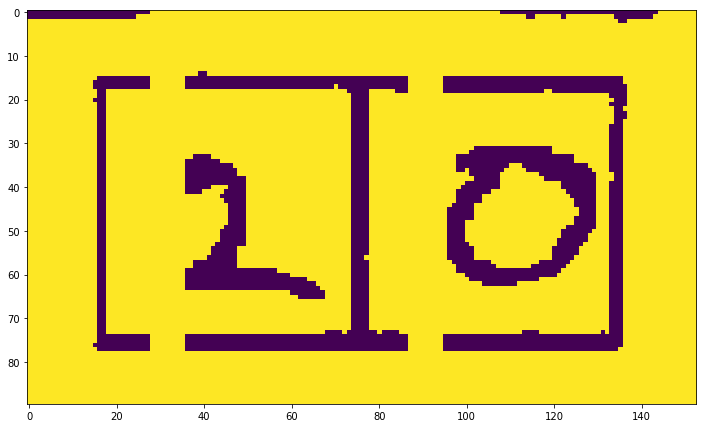

89367116
Numeric
Additional_compulsory_deductible_applicable_Rs


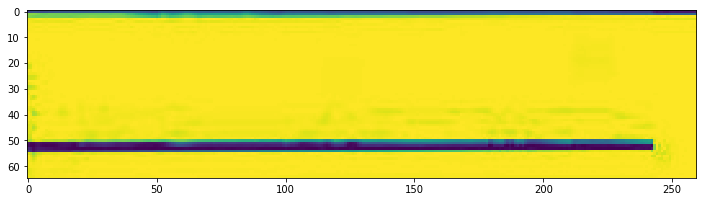

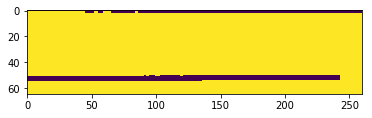

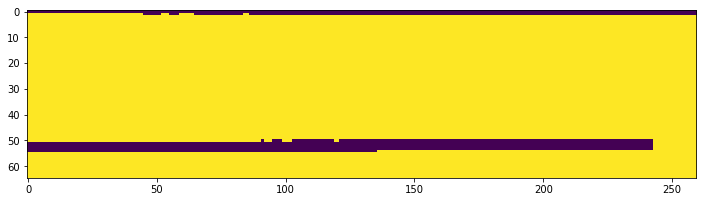

89367116
Numeric
Age Of Nominee


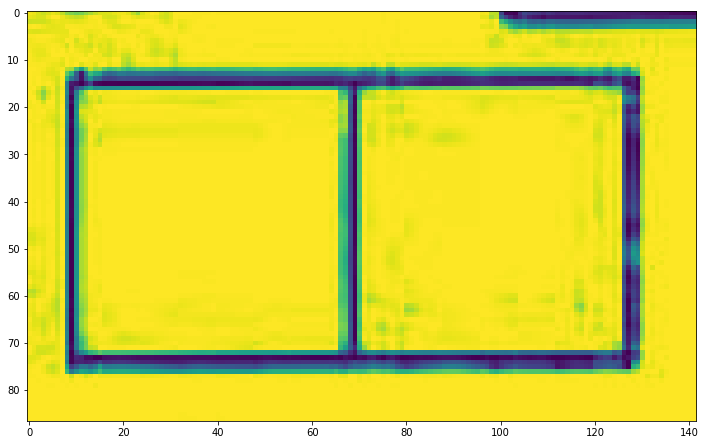

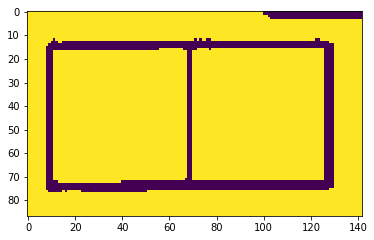

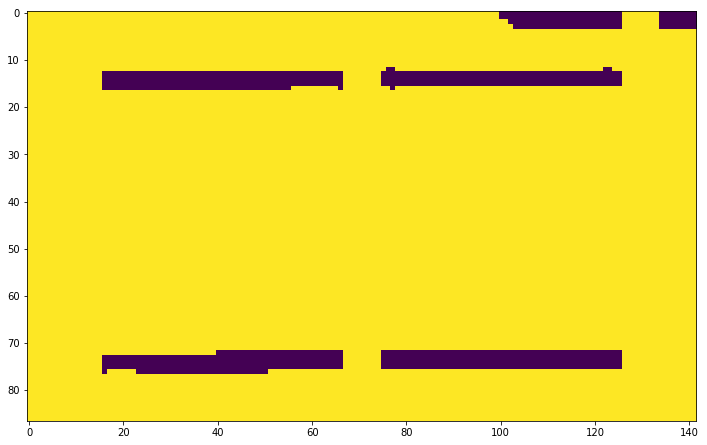

89367116
Numeric
Insured Declared Value of the Vehicle


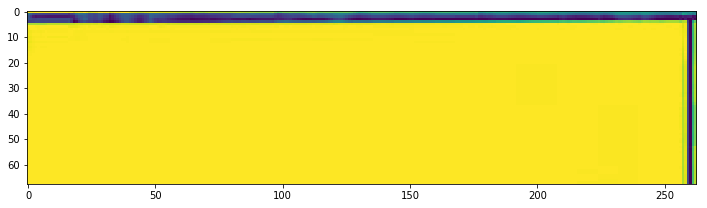

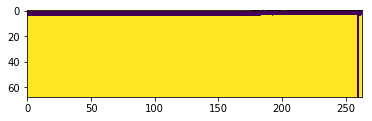

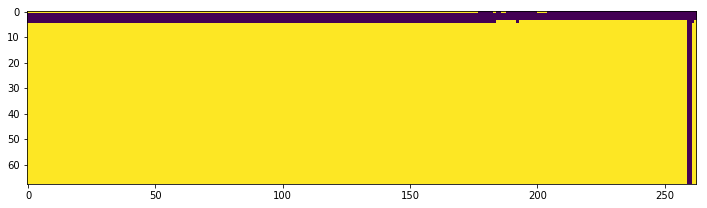

89367116
Numeric
Value_of_CNG_LPG_kit


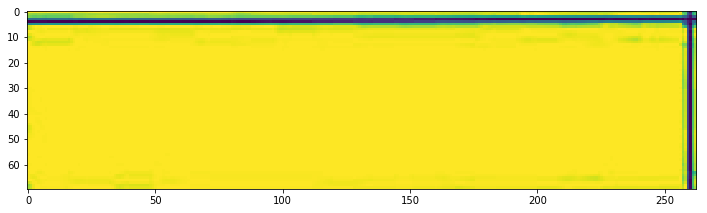

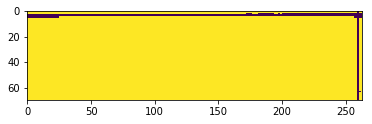

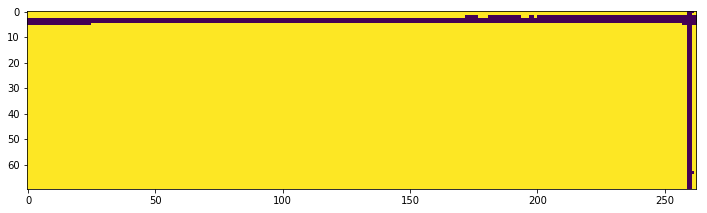

89367116
Numeric
Own_Damage_amount


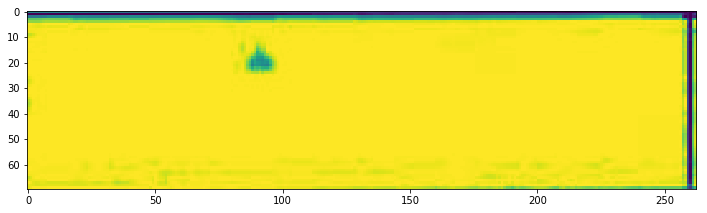

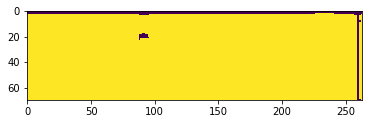

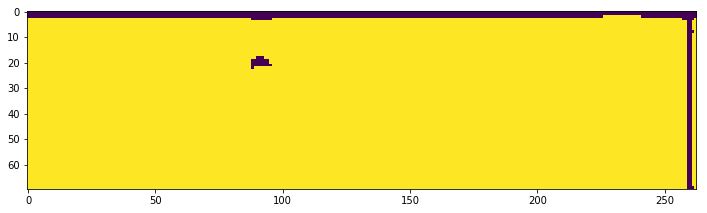

89367116
Numeric
CNG_LPG_kit


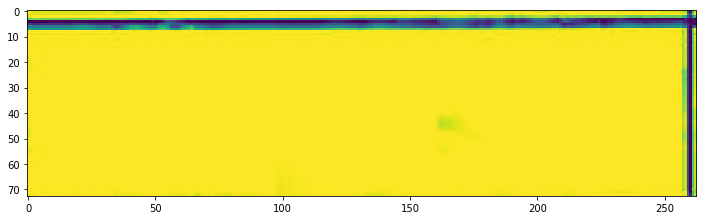

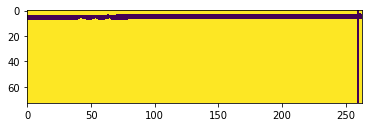

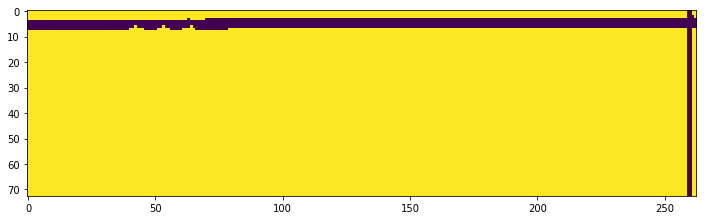

89367116
Numeric
Electrical_Non_Electrical Accessories


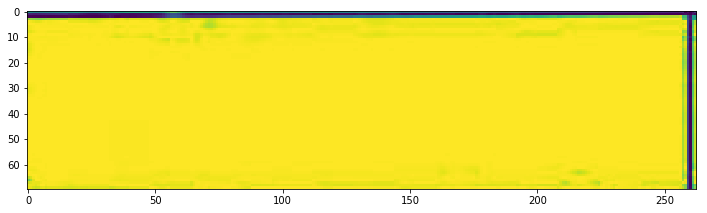

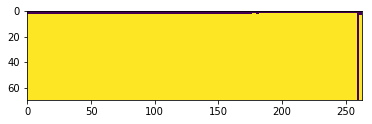

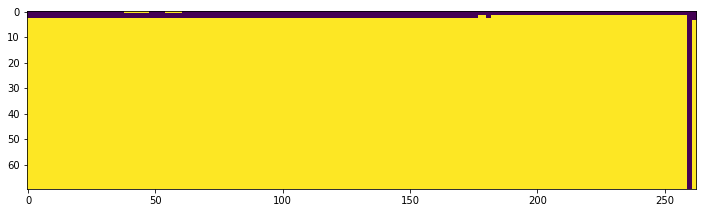

89367116
Numeric
NCB Amount


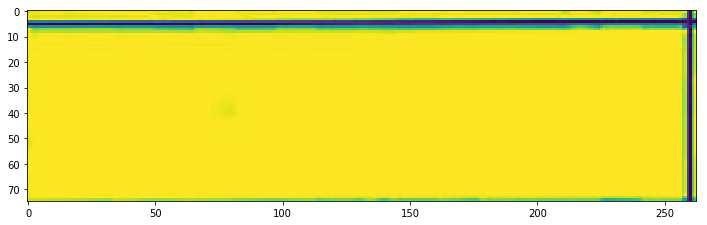

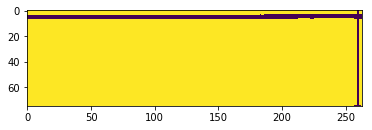

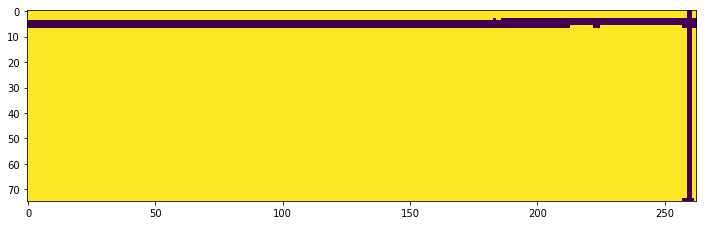

89367116
Numeric
Voluntary_access


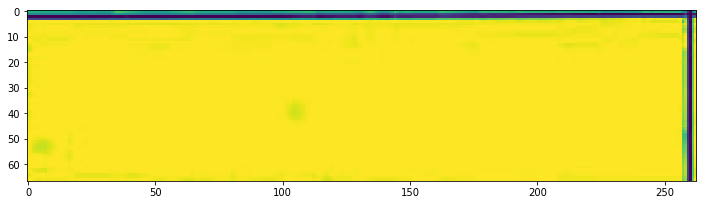

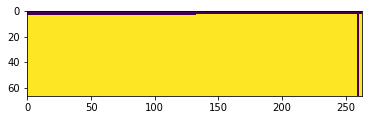

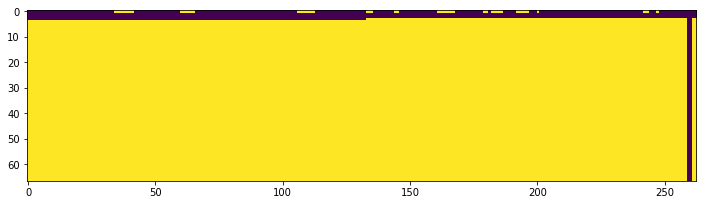

89367116
Numeric
Commercial_Discount


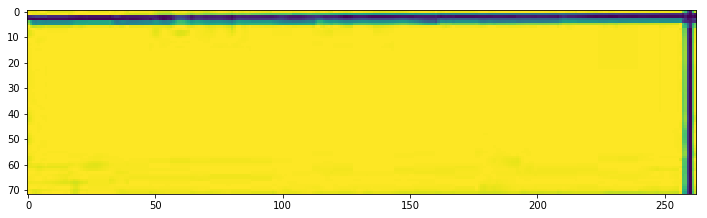

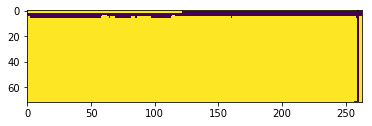

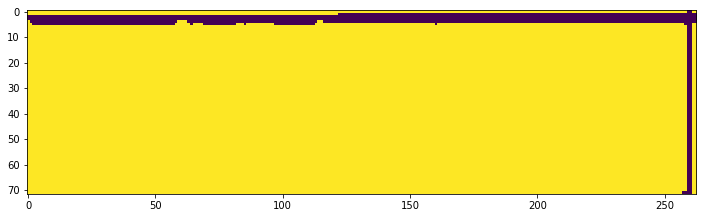

89367116
Numeric
Total_amount_own_damage


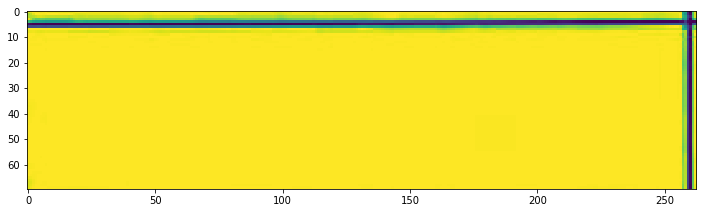

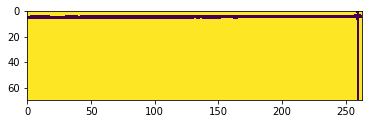

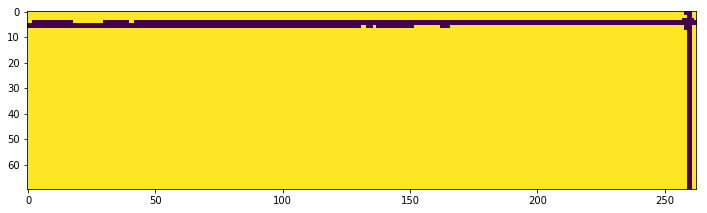

89367116
Numeric
Net_Premium


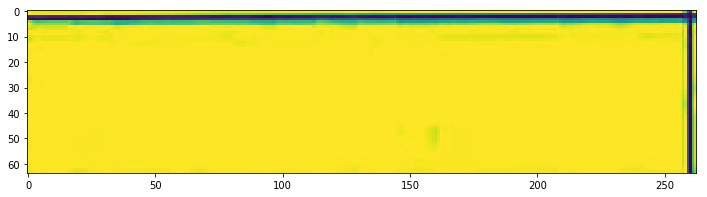

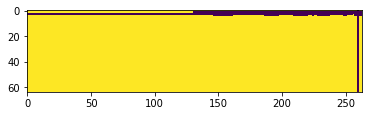

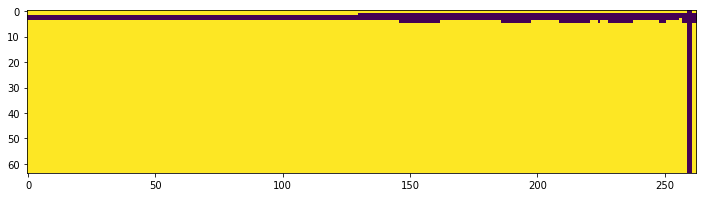

89367116
Numeric
Service_tax


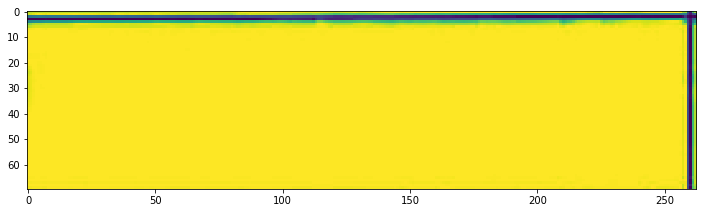

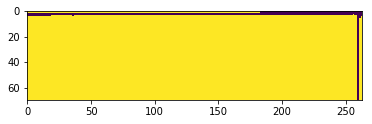

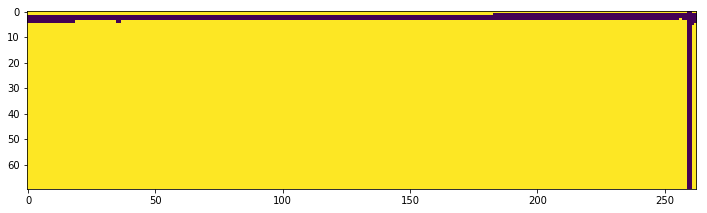

89367116
Numeric
Gross_Premium


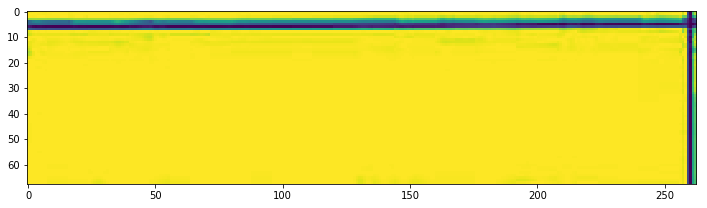

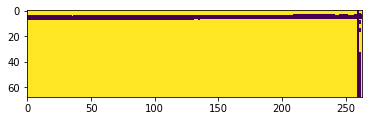

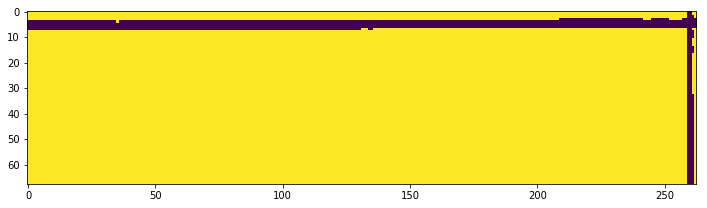

89367116
Numeric
Value of electrical accessories fitted in the vehicle


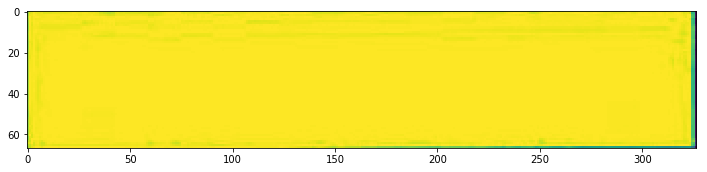

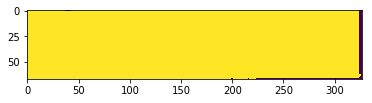

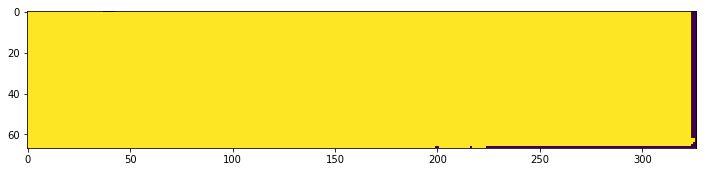

89367116
Numeric
Value of Non electrical accessories fitted to the vehicle


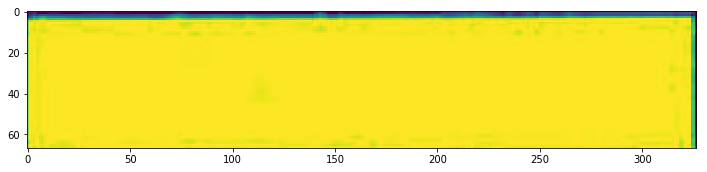

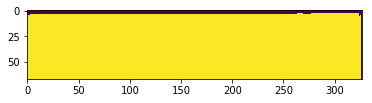

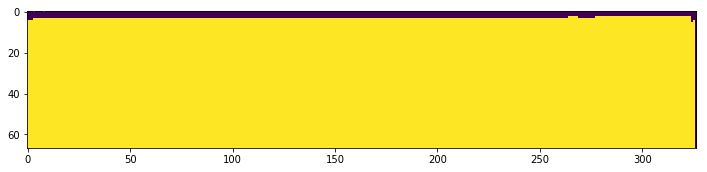

89367116
Numeric
Total IDV 


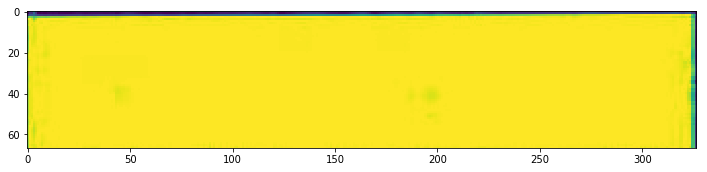

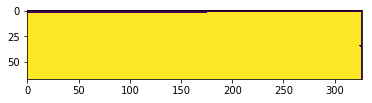

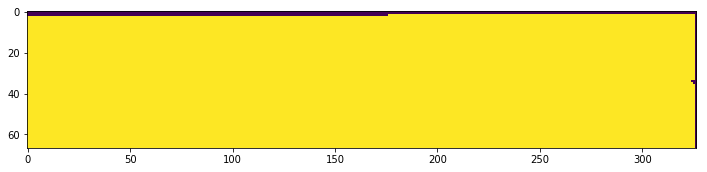

89367116
Numeric
Basic TP cover


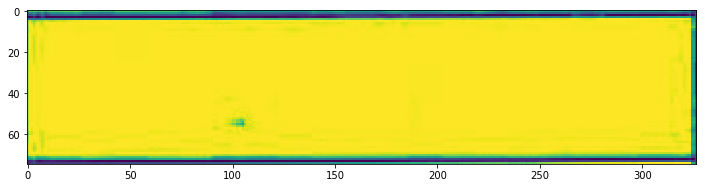

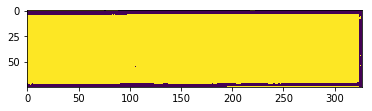

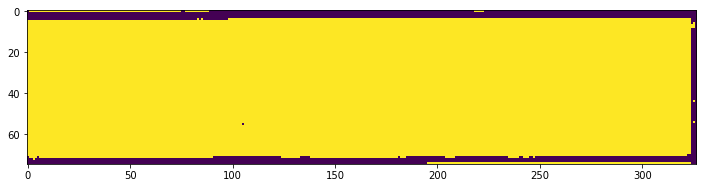

89367116
Numeric
TPPD Restriction 


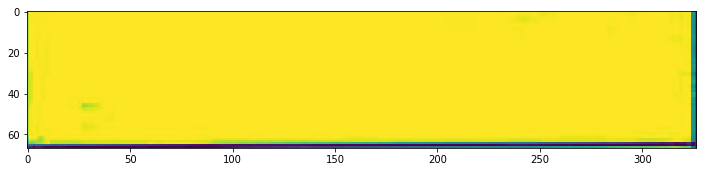

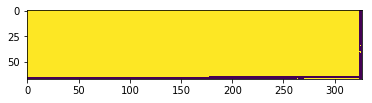

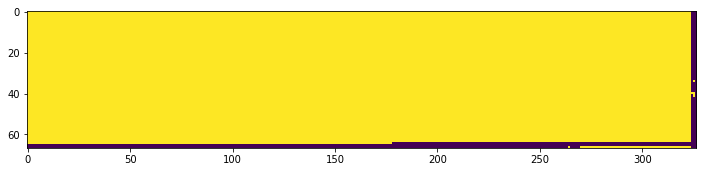

89367116
Numeric
CNG_LPG


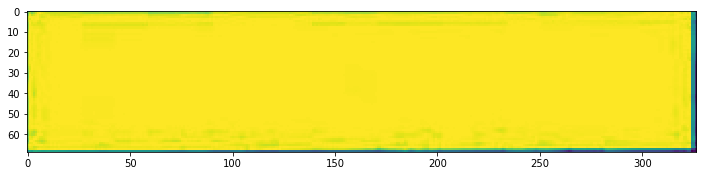

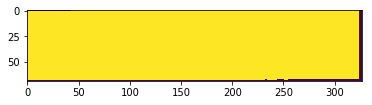

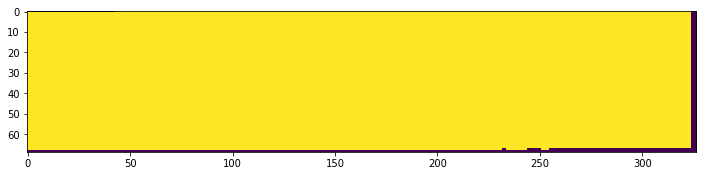

89367116
Numeric
PA for owner driver


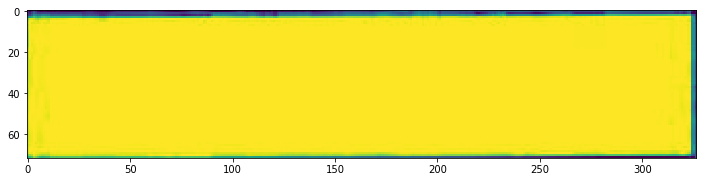

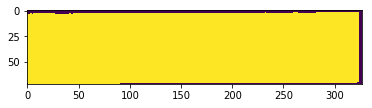

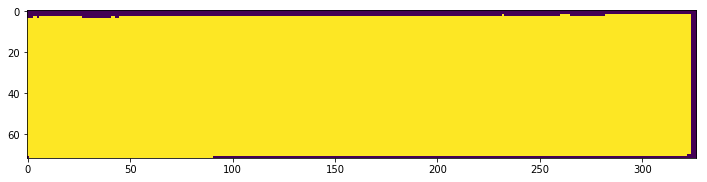

89367116
Numeric
Sum insured per person


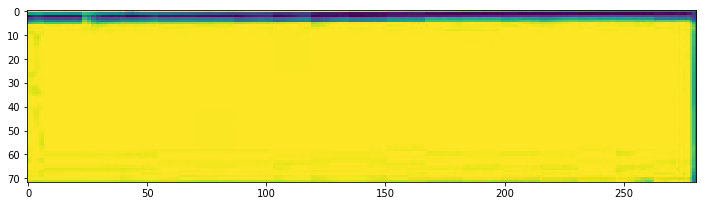

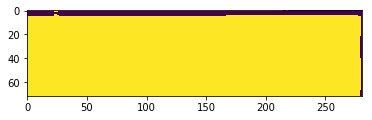

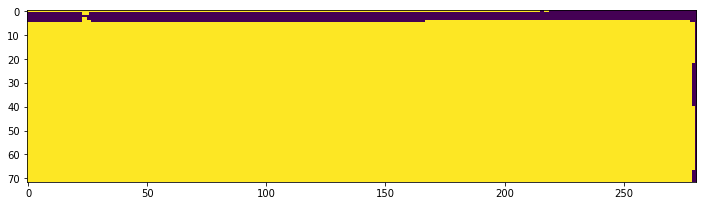

89367116
Numeric
Number of persons


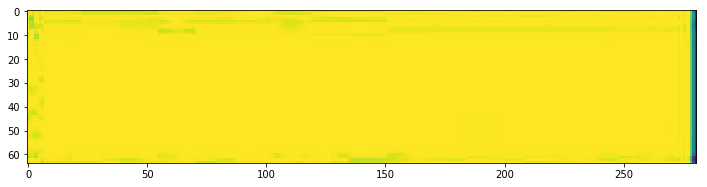

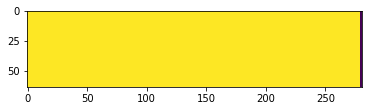

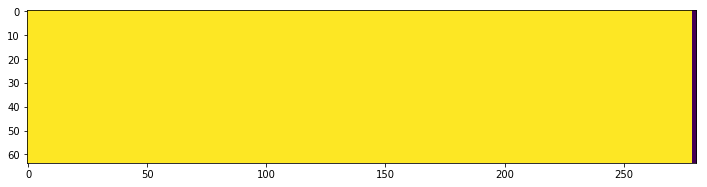

89367116
Numeric
PA for passengers Amount


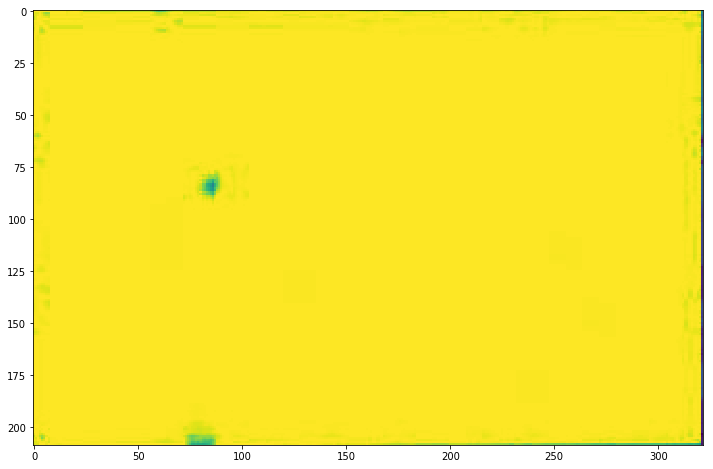

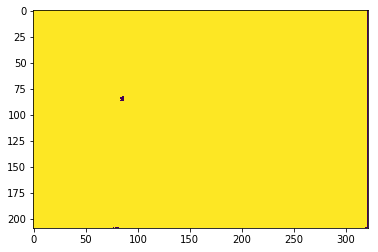

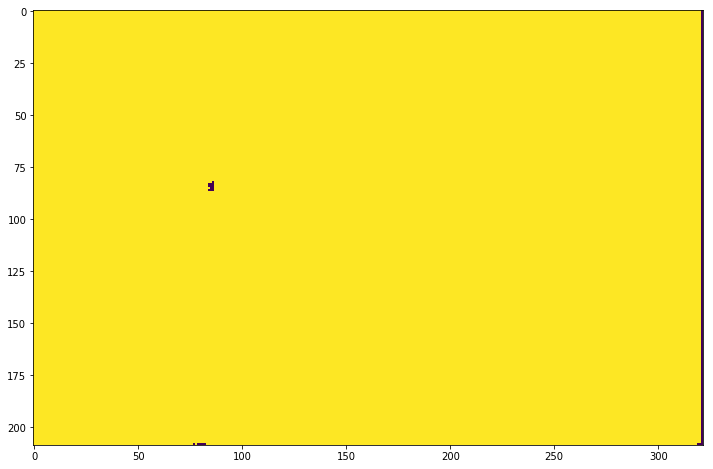

89367116
Numeric
Legal liability for paid driver


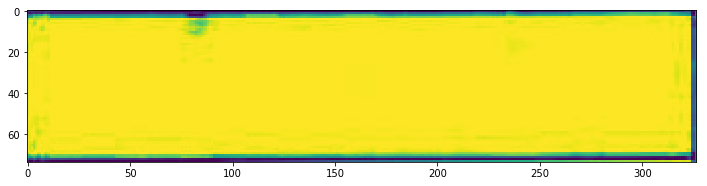

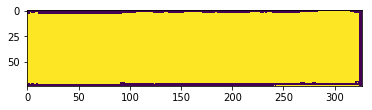

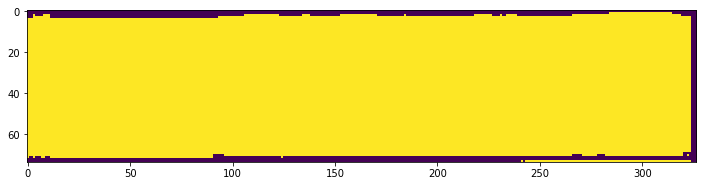

89367116
Numeric
Number of employees


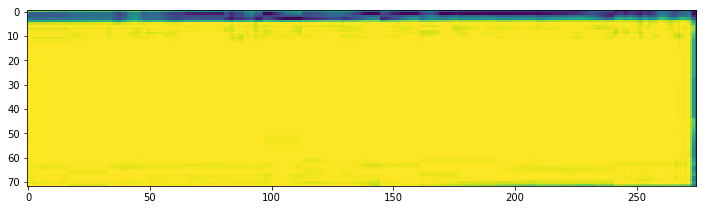

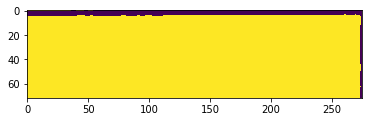

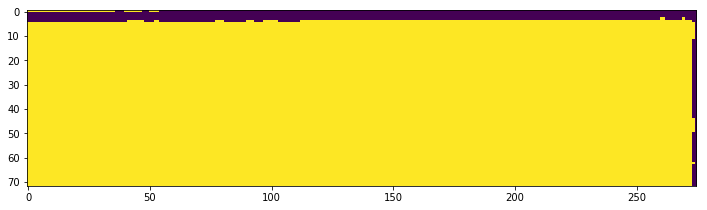

89367116
Numeric
Total_amount_liability


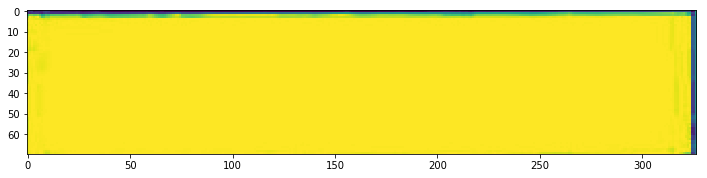

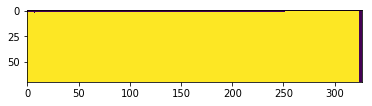

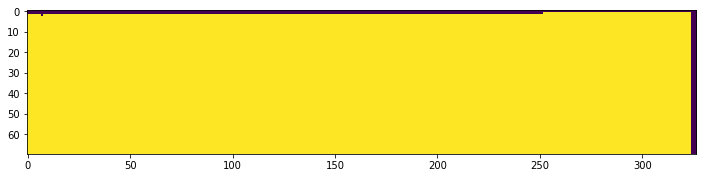

89367116
Numeric
Cheque Number


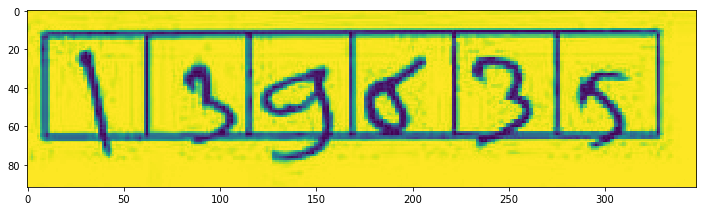

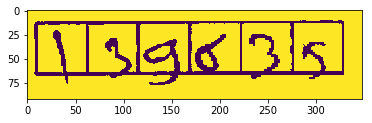

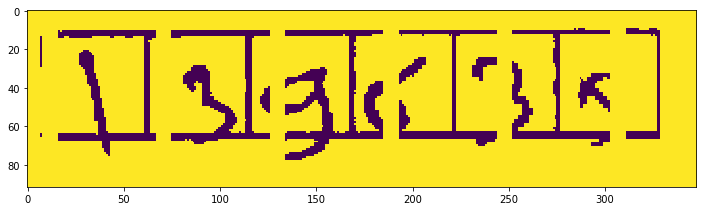

89367116
Numeric
Cheque Date


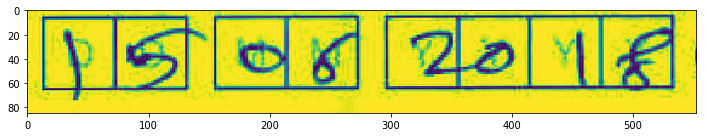

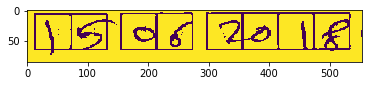

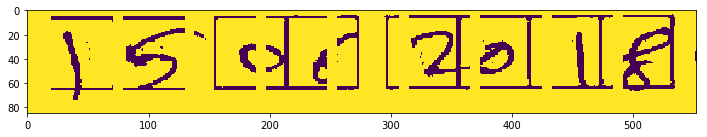

89367116
Numeric
Date


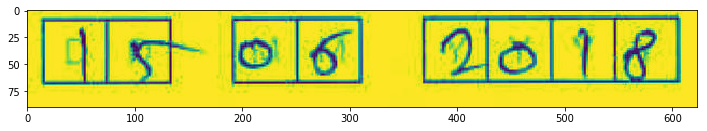

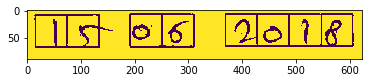

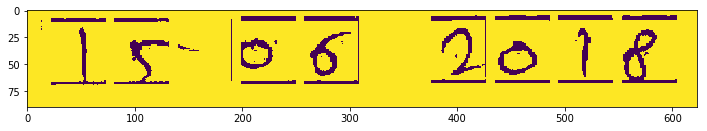

89367116
Character
IMD Name


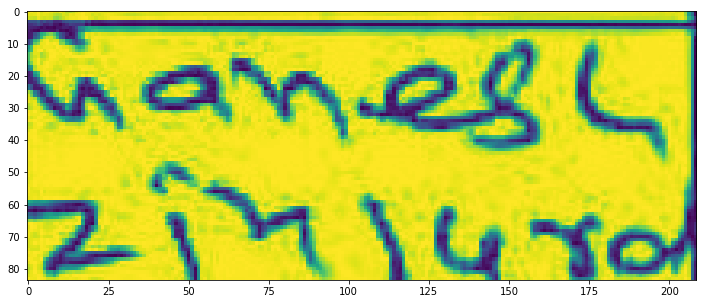

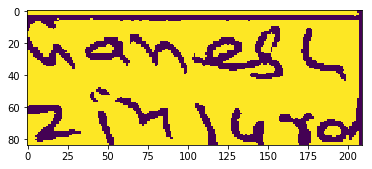

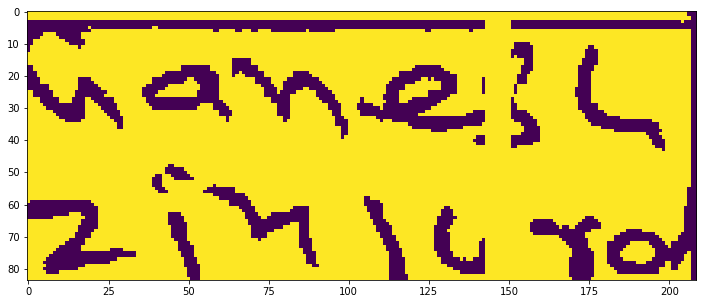

89367116
Character
Title


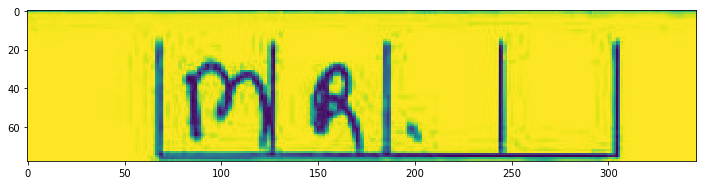

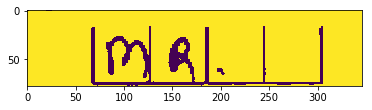

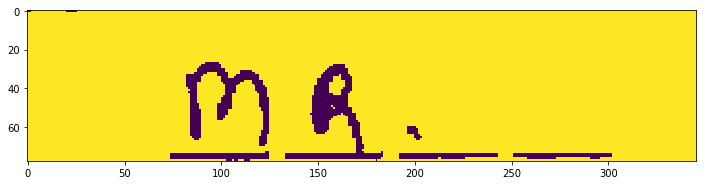

89367116
Character
First name


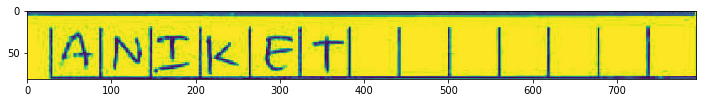

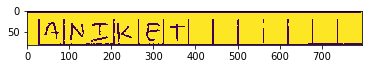

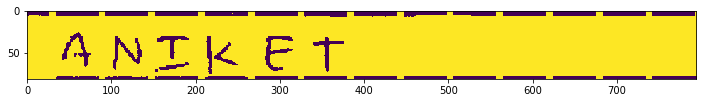

89367116
Character
Middle Name


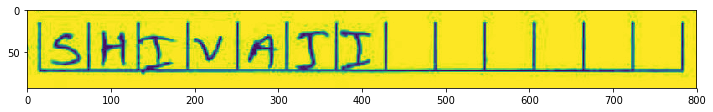

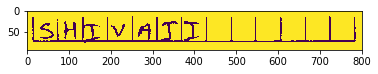

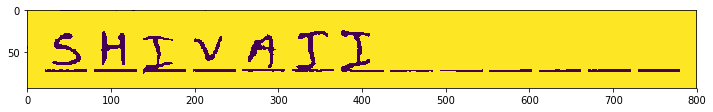

89367116
Character
Surname


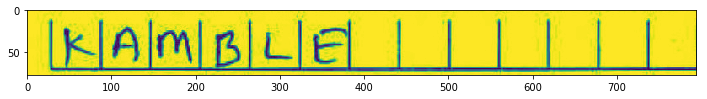

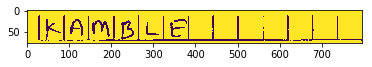

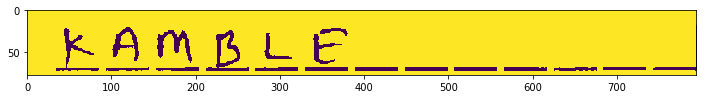

89367116
Character
Are you an existing Bajaj Allianz customer_Policy No


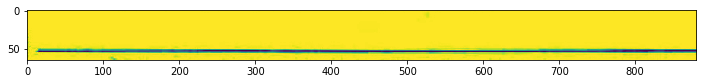

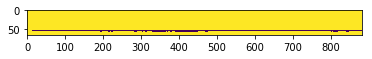

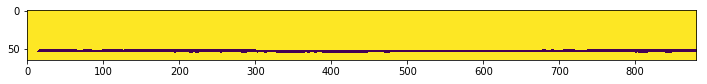

89367116
Character
City


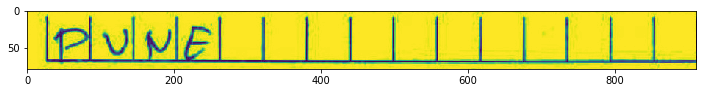

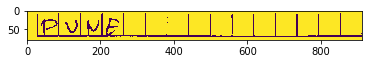

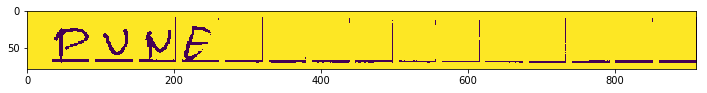

89367116
Character
State


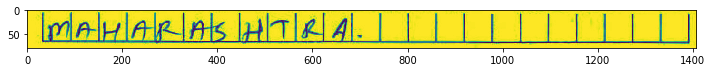

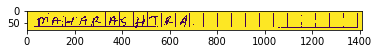

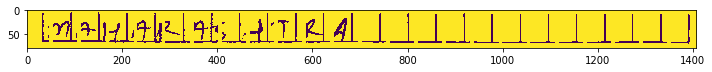

89367116
Character
Make


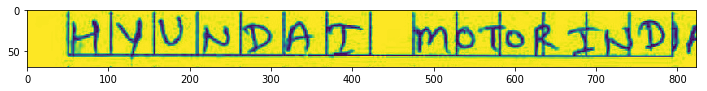

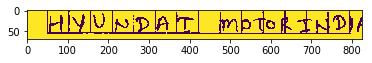

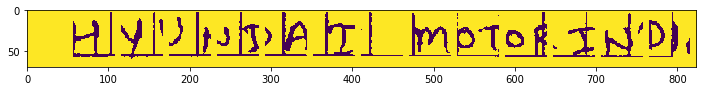

89367116
Character
Name Of Financial Institution


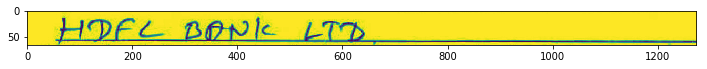

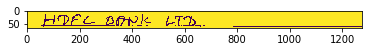

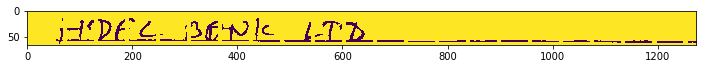

89367116
Character
Name of the Nominee


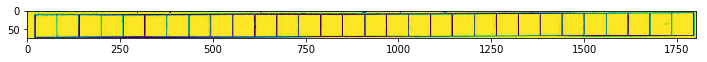

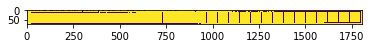

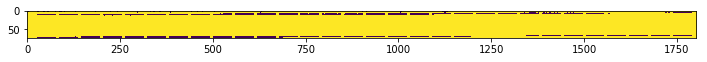

89367116
Character
Relationship of the Nominee


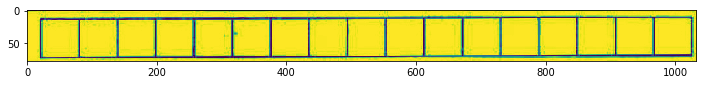

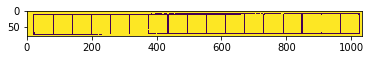

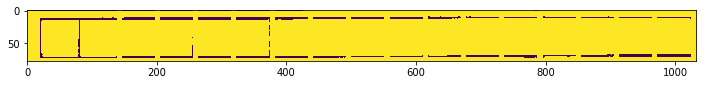

89367116
Character
Others


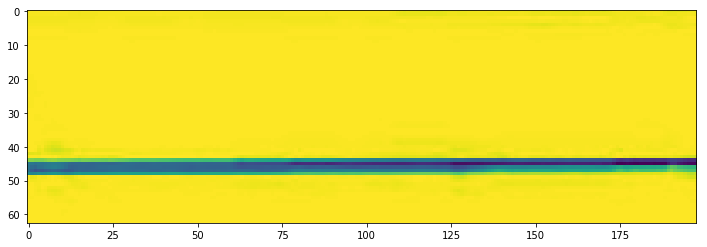

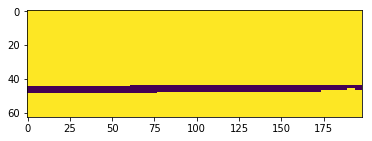

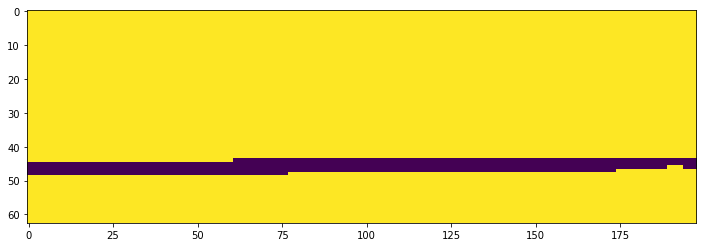

89367116
Character
Place


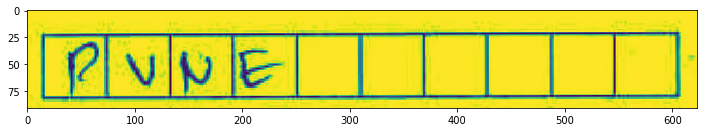

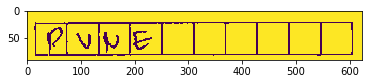

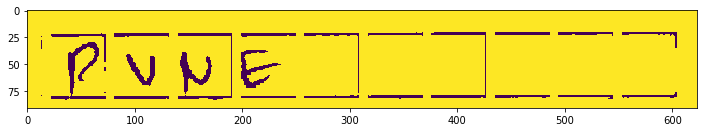

89367116
Character
Name and designation


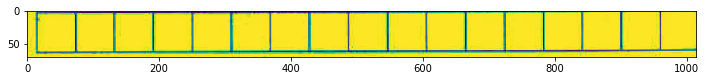

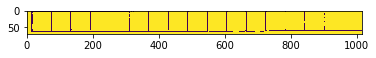

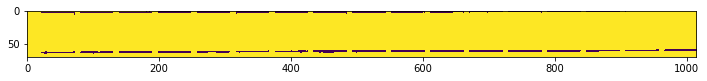

89367116
Alpha Numeric
PAN Number


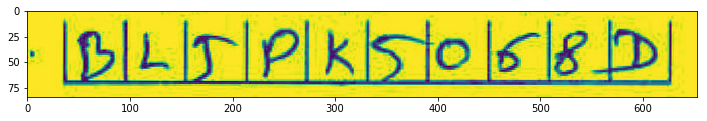

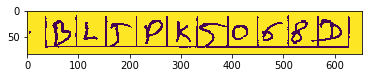

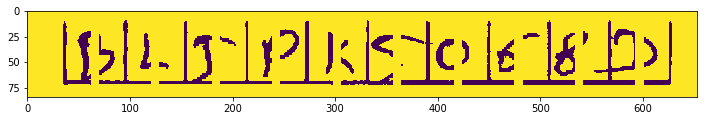

89367116
Alpha Numeric
Email


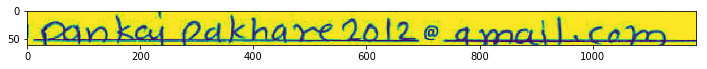

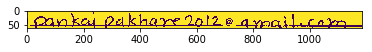

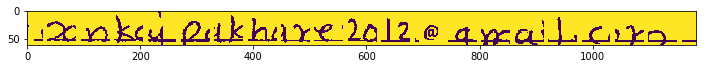

89367116
Alpha Numeric
Registration Number


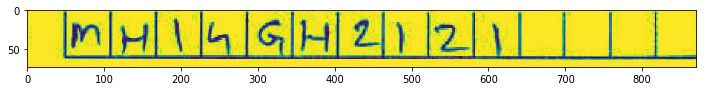

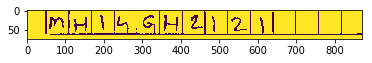

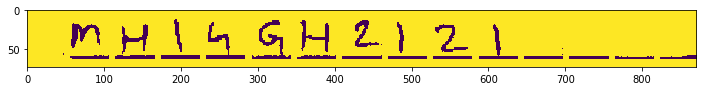

89367116
Alpha Numeric
Engine Number


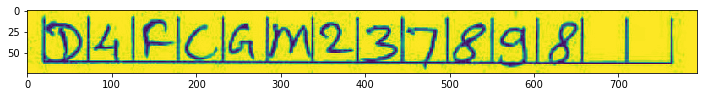

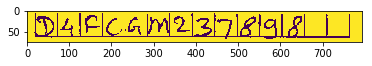

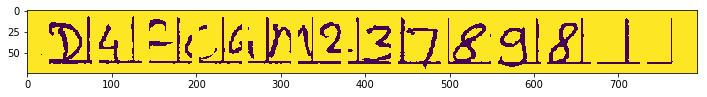

89367116
Alpha Numeric
Chasis Number


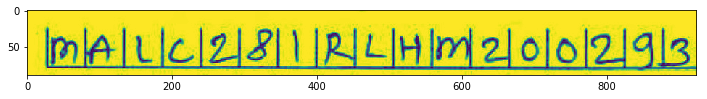

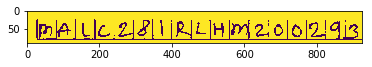

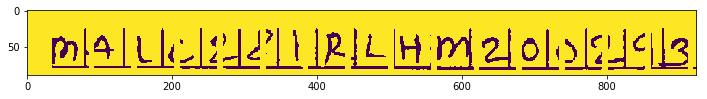

89367116
Alpha Numeric
Model


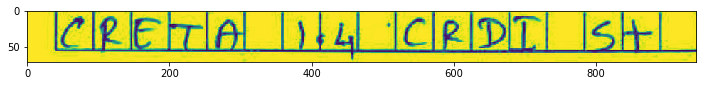

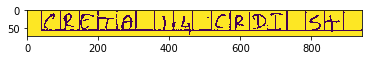

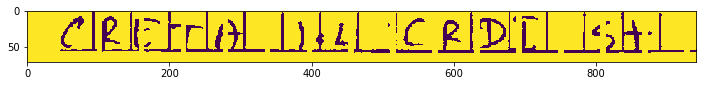

87395726
Numeric
Scrutiny Number


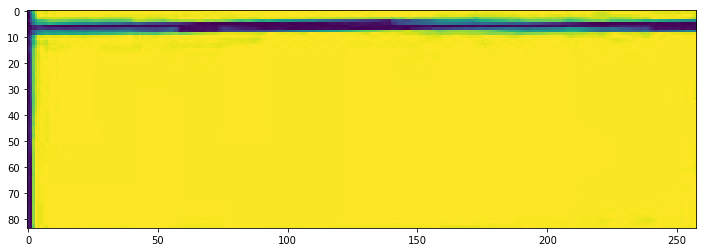

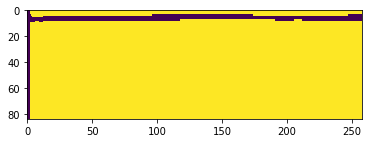

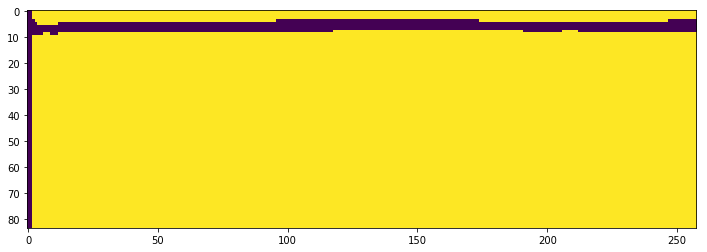

87395726
Numeric
Receipt Number


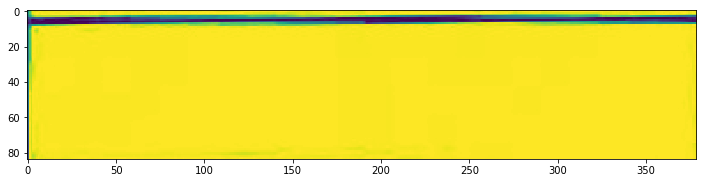

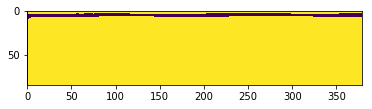

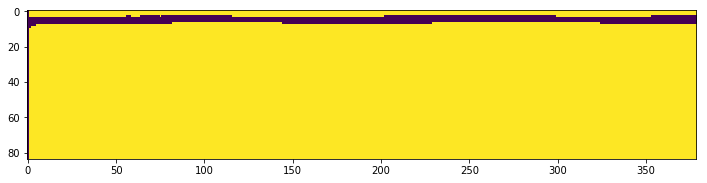

87395726
Numeric
Policy Number


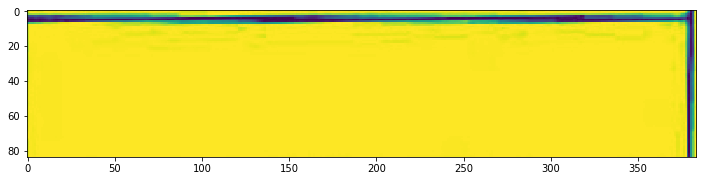

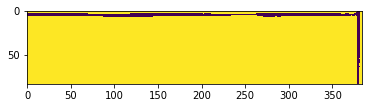

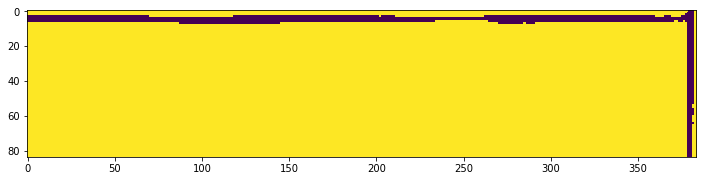

87395726
Numeric
IMD Code


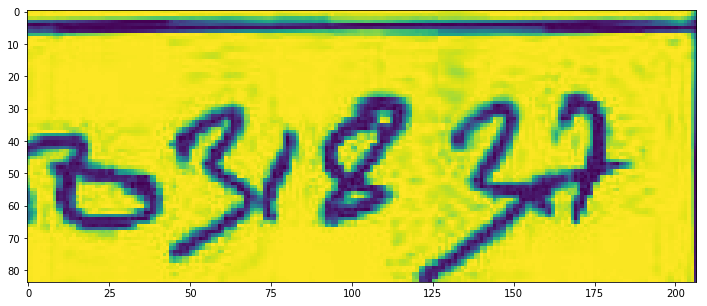

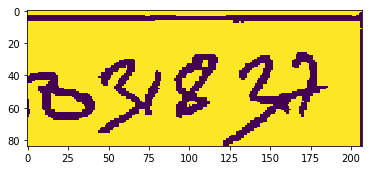

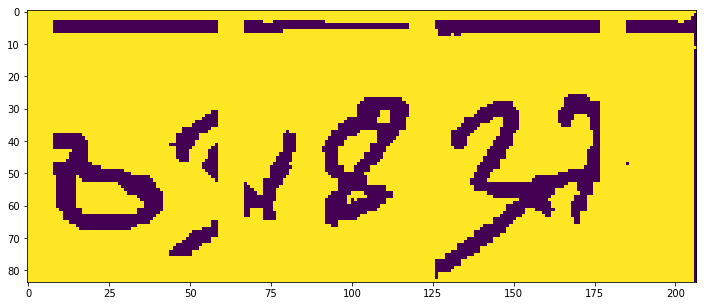

87395726
Numeric
Sub IMD Code


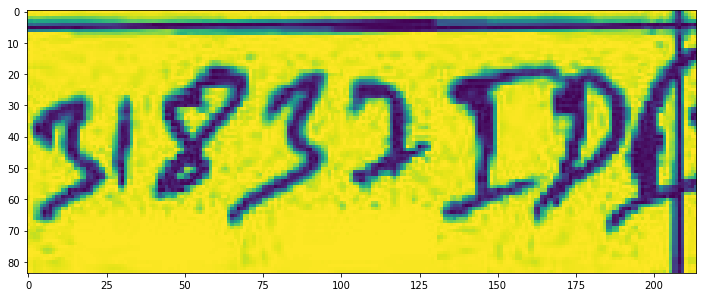

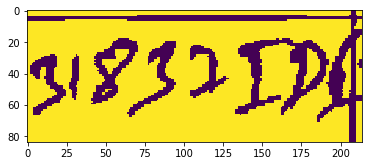

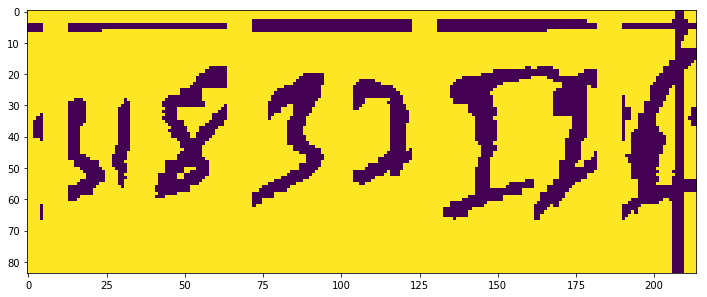

87395726
Numeric
Mobile Number_T


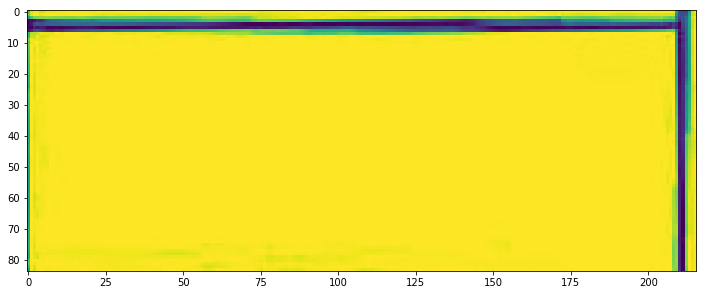

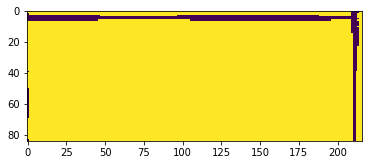

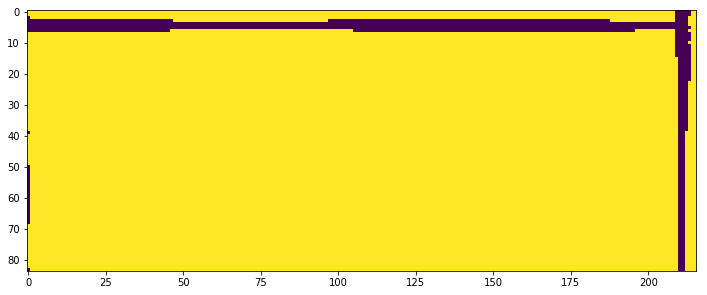

87395726
Numeric
Emp Code


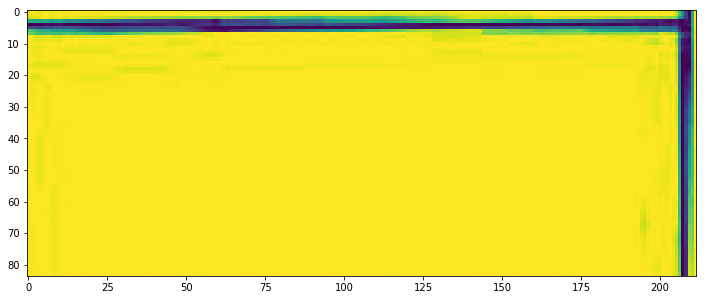

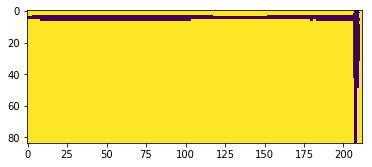

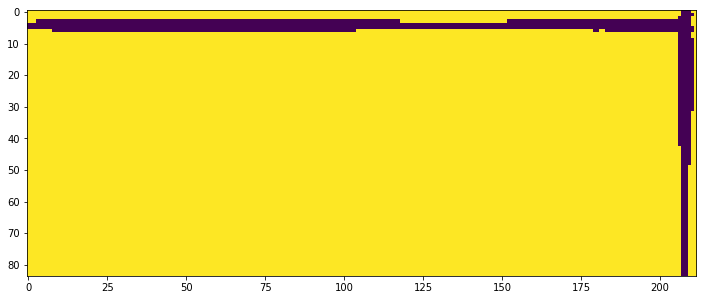

87395726
Numeric
Date Of Birth


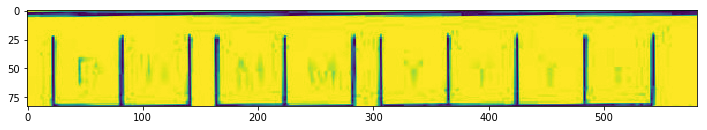

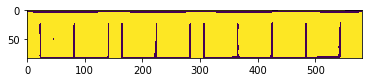

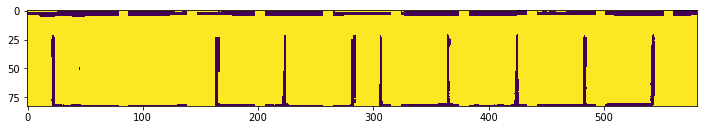

87395726
Numeric
UID


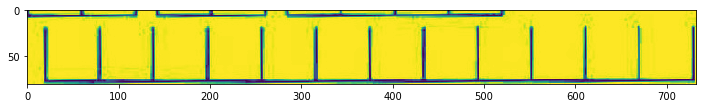

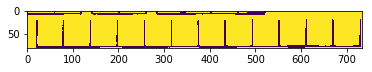

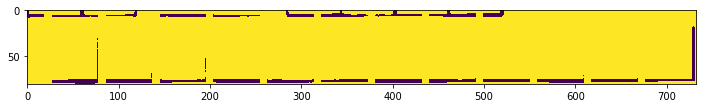

87395726
Numeric
Pincode


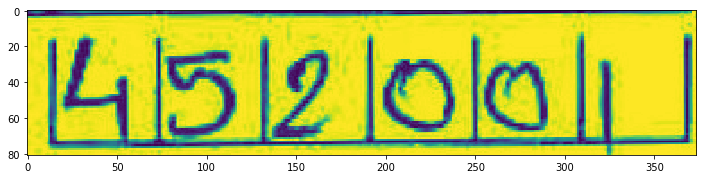

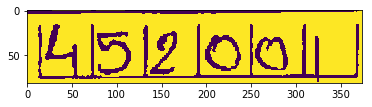

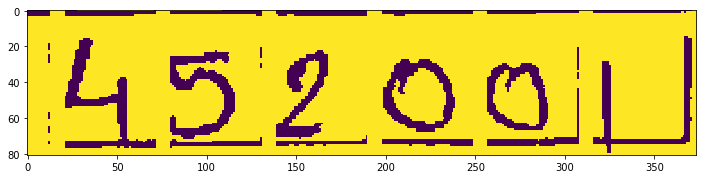

87395726
Numeric
Telephone_Res


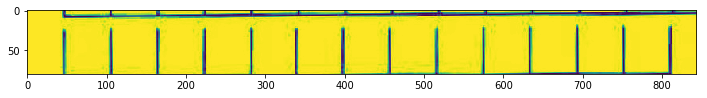

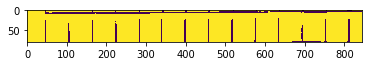

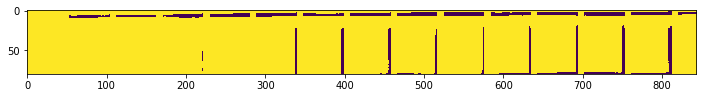

87395726
Numeric
Telephone_Office


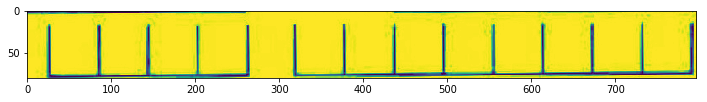

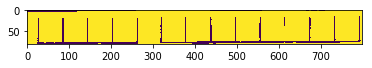

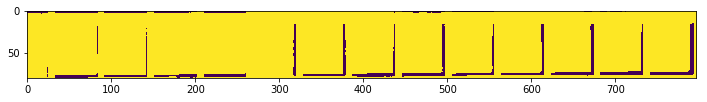

87395726
Numeric
Mobile Number


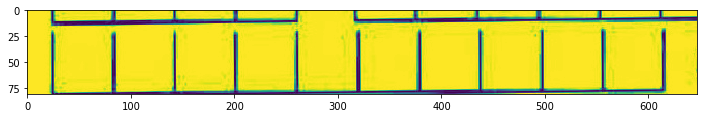

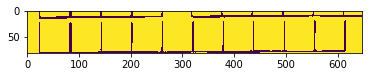

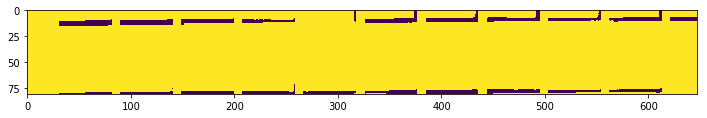

87395726
Numeric
Period of Insurance From


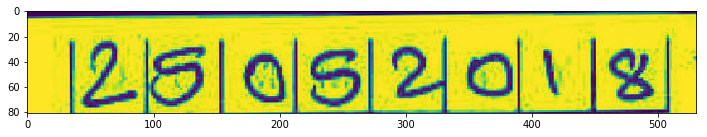

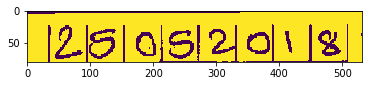

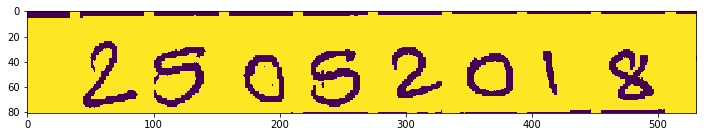

87395726
Numeric
Period of Insurance To


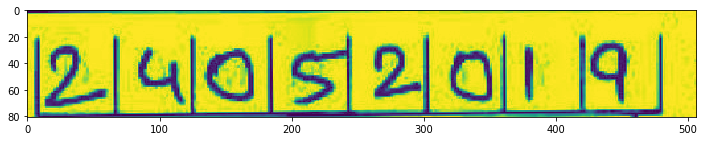

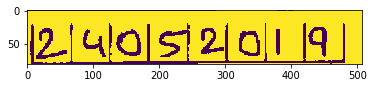

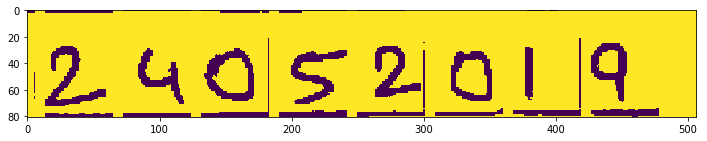

87395726
Numeric
Age at which you got the licence


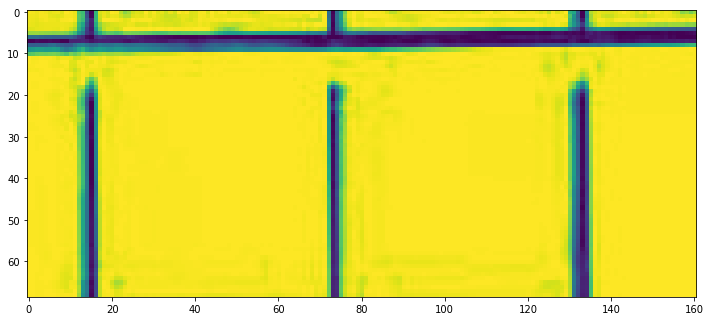

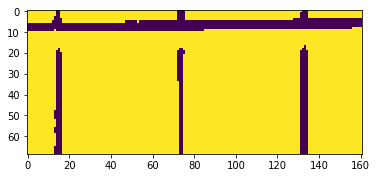

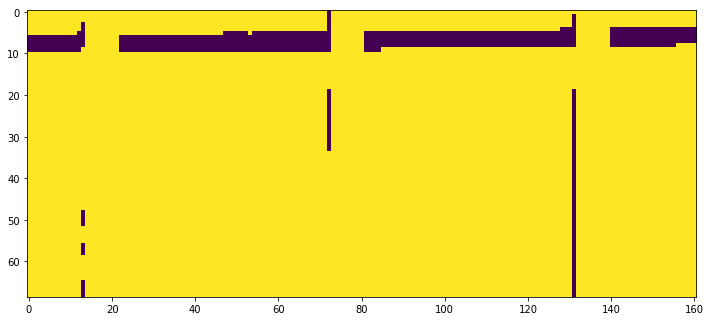

87395726
Numeric
Date Of Registration


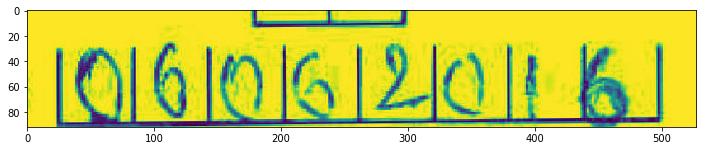

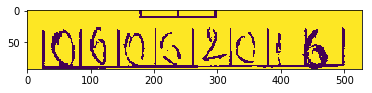

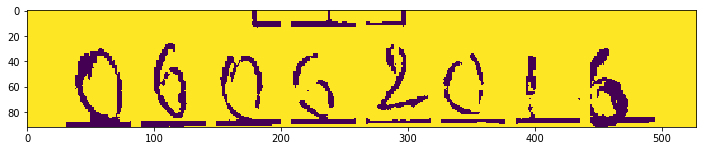

87395726
Numeric
Year Of Manufacture


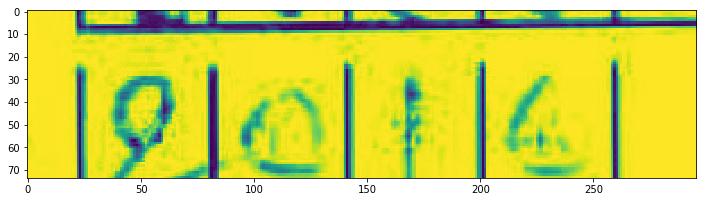

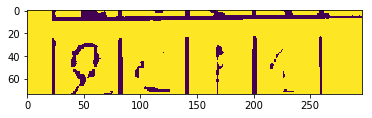

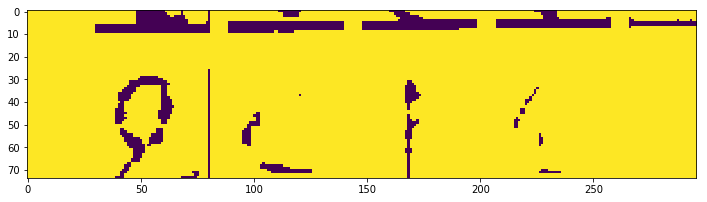

87395726
Numeric
Date of purchase of the Vehicle by you


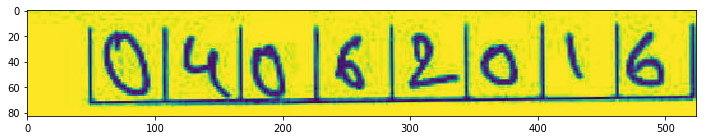

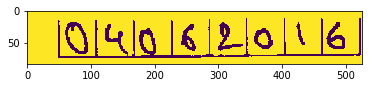

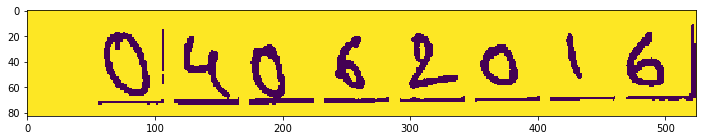

87395726
Numeric
Cubic Capacity


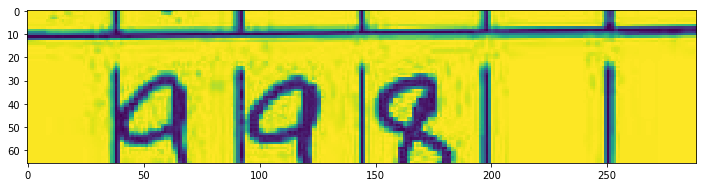

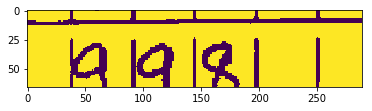

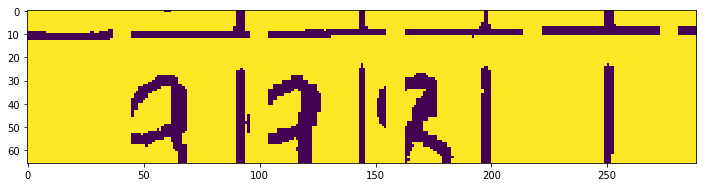

87395726
Numeric
Seating Capacity


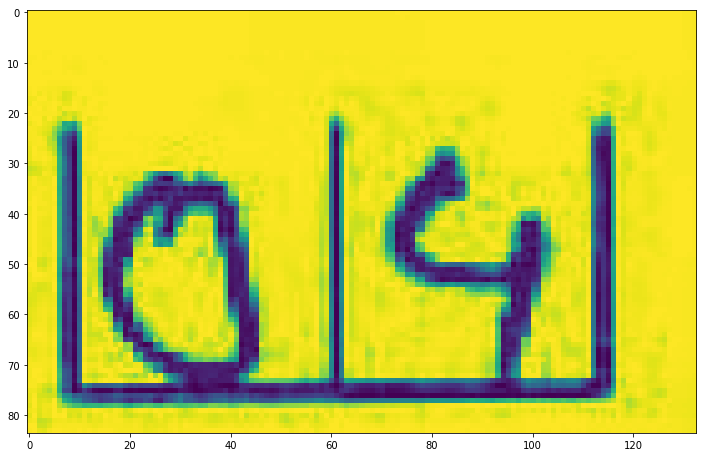

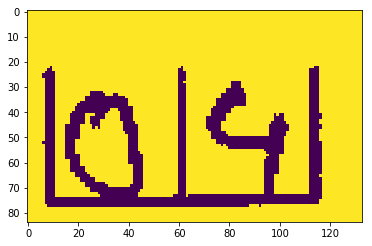

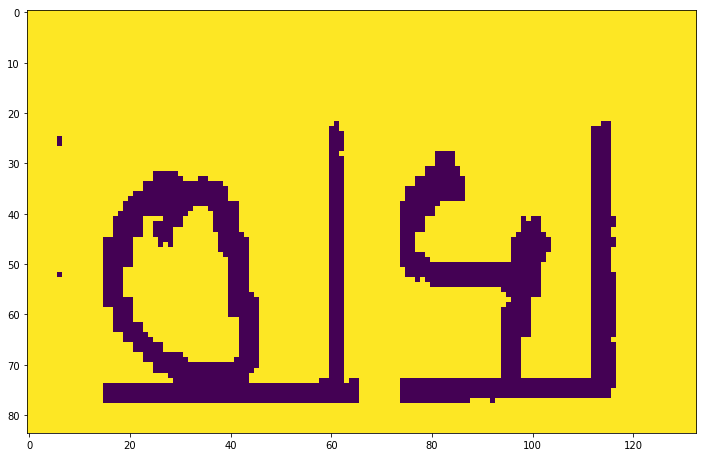

87395726
Numeric
Kilometer reading as on date


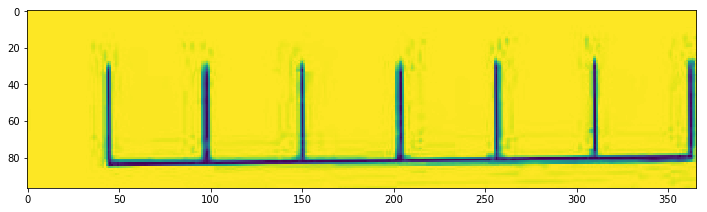

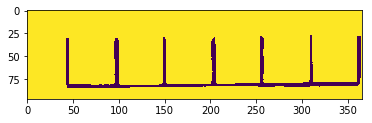

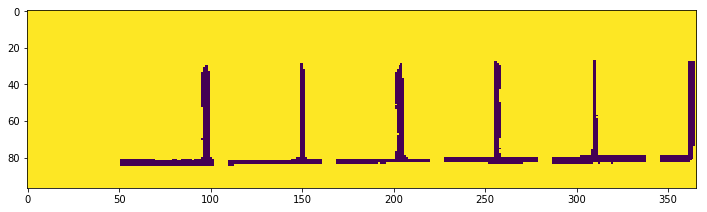

87395726
Numeric
Loan Account Number


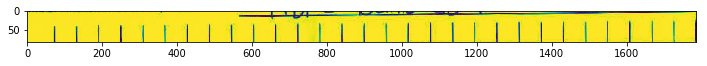

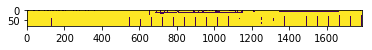

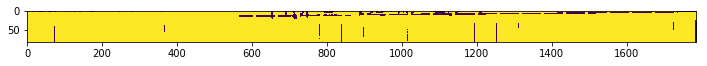

87395726
Numeric
If Yes Number Of Claims


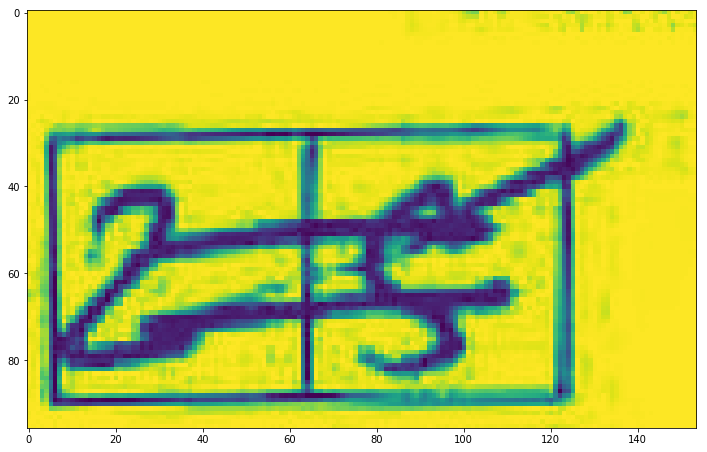

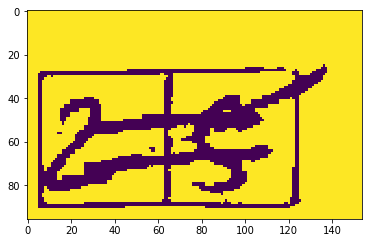

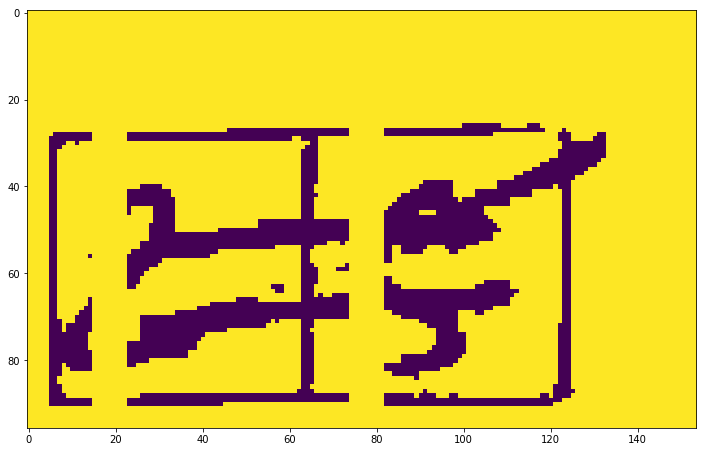

87395726
Numeric
Claim Amount


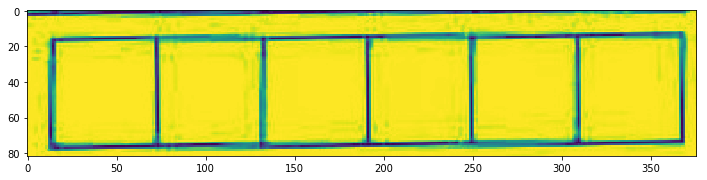

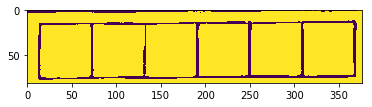

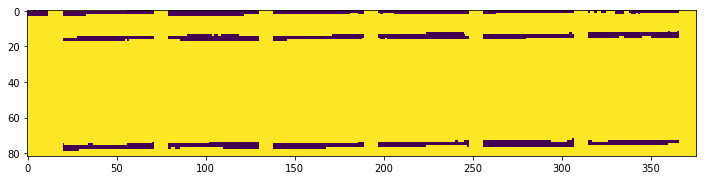

87395726
Numeric
NCB Earned On Last Policy


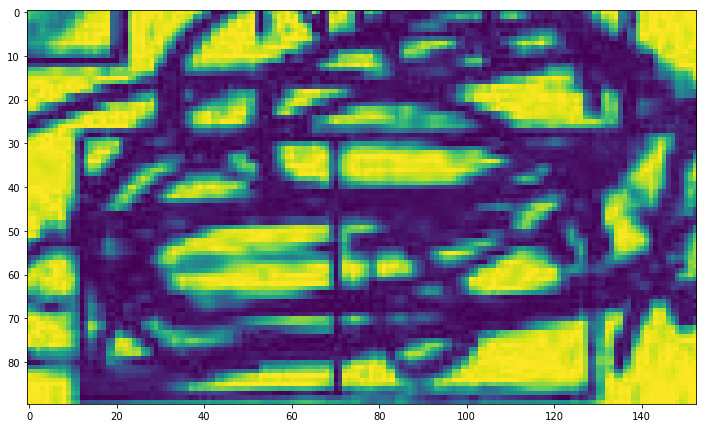

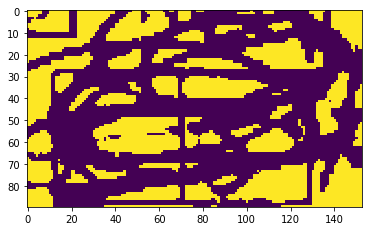

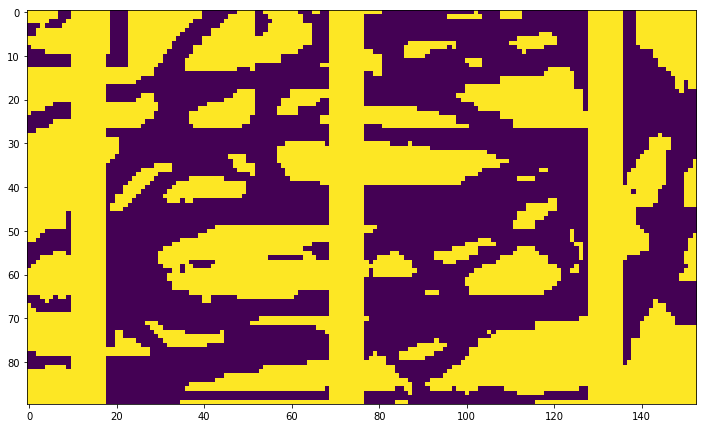

87395726
Numeric
Additional_compulsory_deductible_applicable_Rs


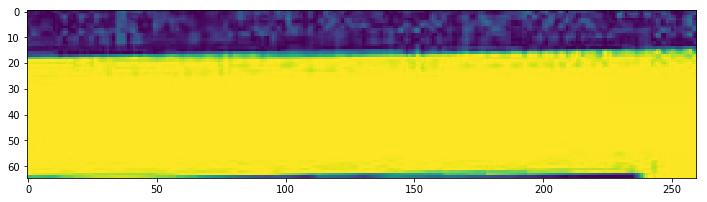

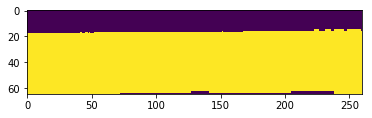

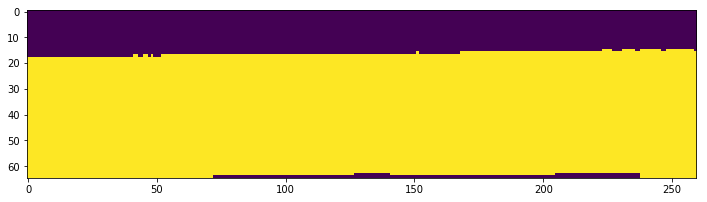

87395726
Numeric
Age Of Nominee


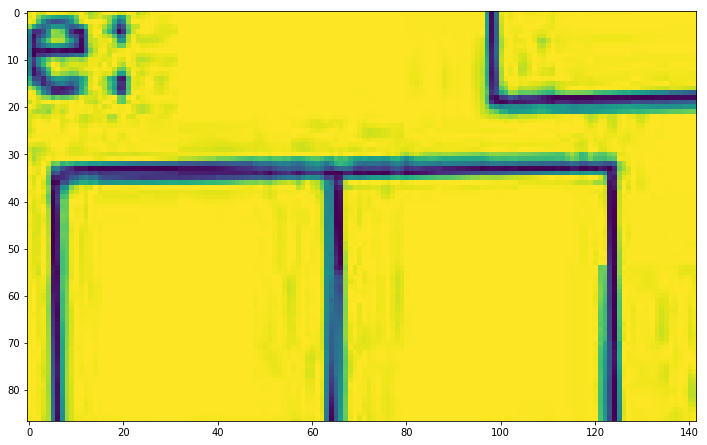

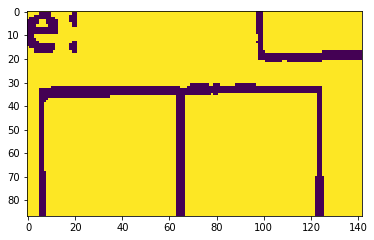

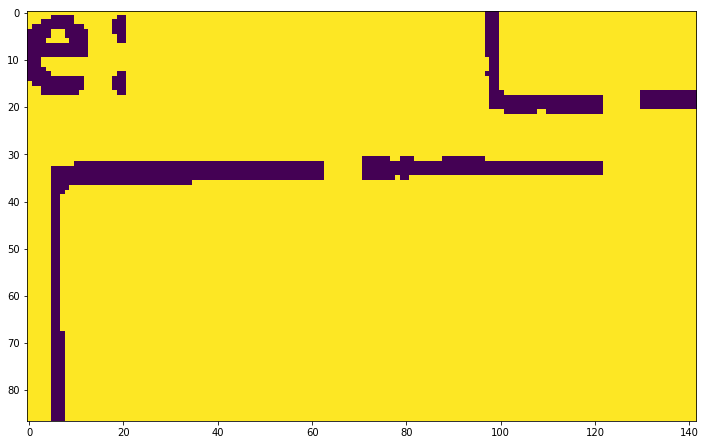

87395726
Numeric
Insured Declared Value of the Vehicle


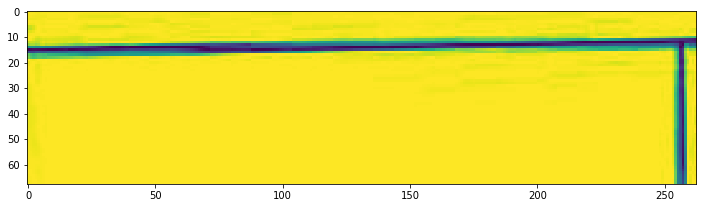

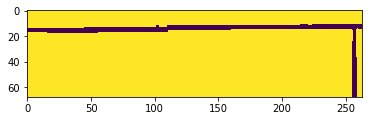

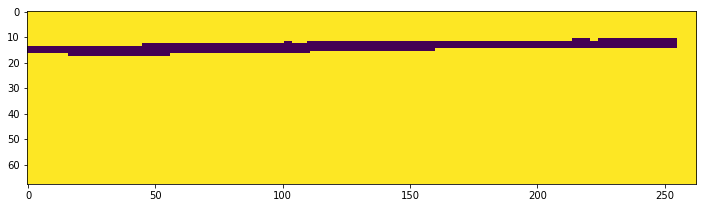

87395726
Numeric
Value_of_CNG_LPG_kit


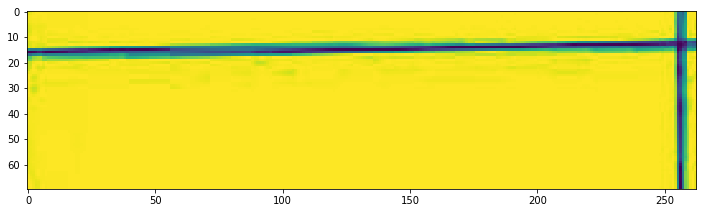

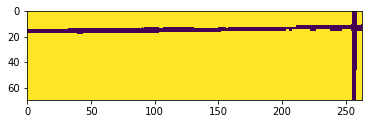

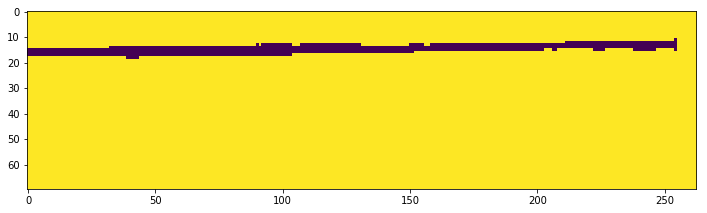

87395726
Numeric
Own_Damage_amount


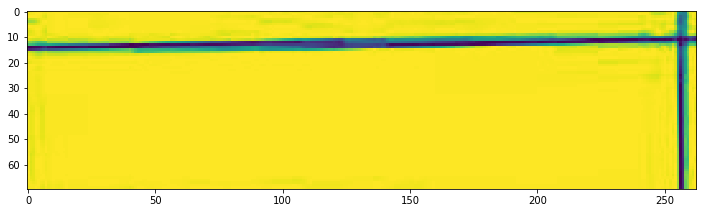

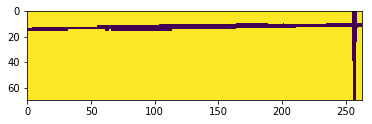

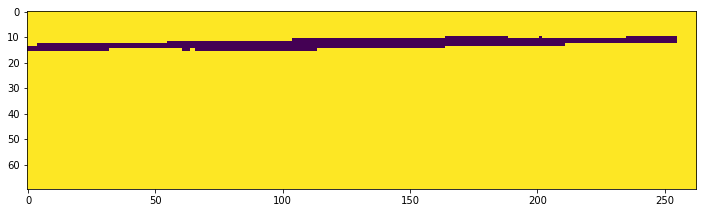

87395726
Numeric
CNG_LPG_kit


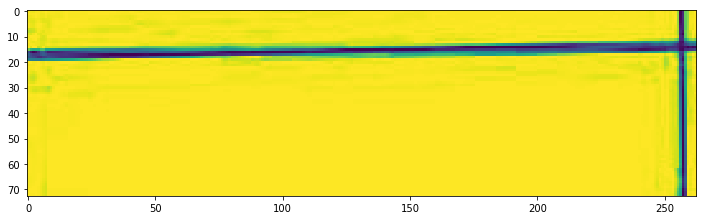

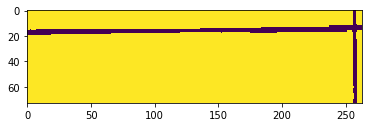

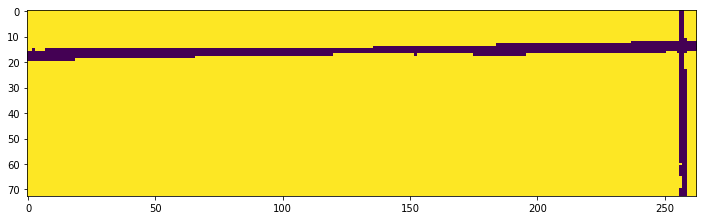

87395726
Numeric
Electrical_Non_Electrical Accessories


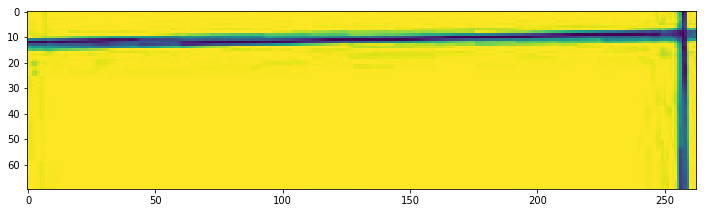

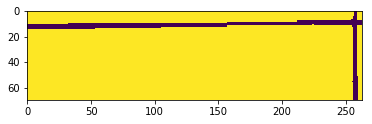

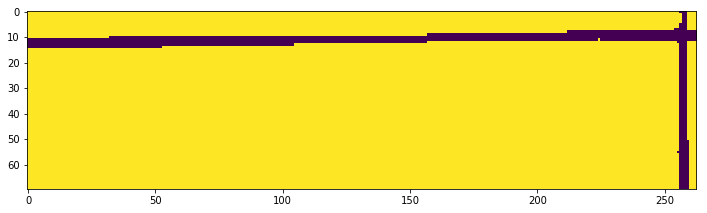

87395726
Numeric
NCB Amount


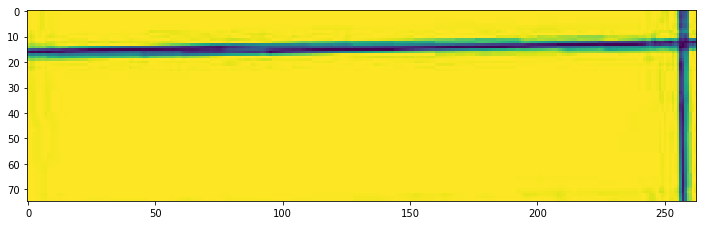

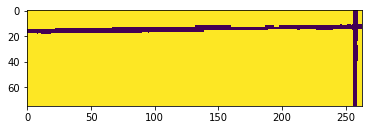

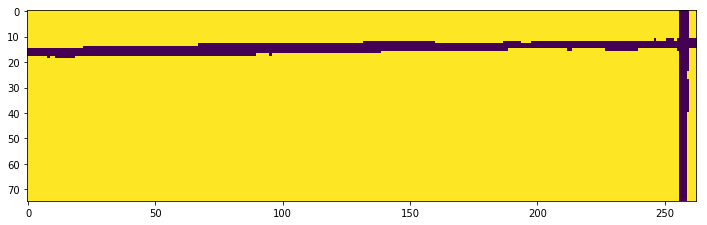

87395726
Numeric
Voluntary_access


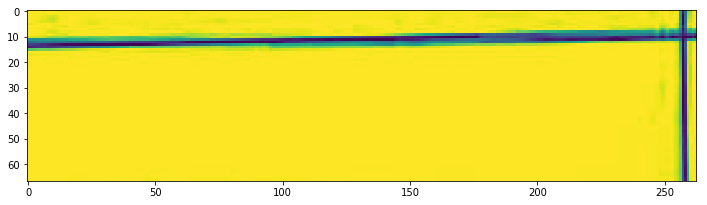

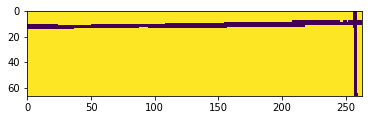

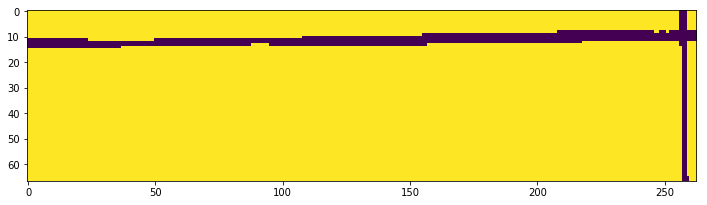

87395726
Numeric
Commercial_Discount


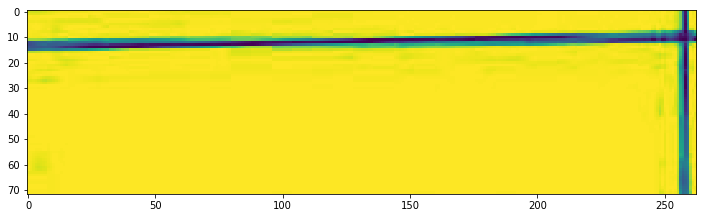

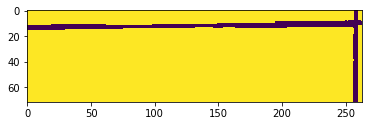

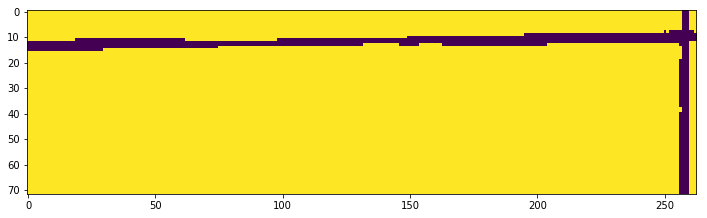

87395726
Numeric
Total_amount_own_damage


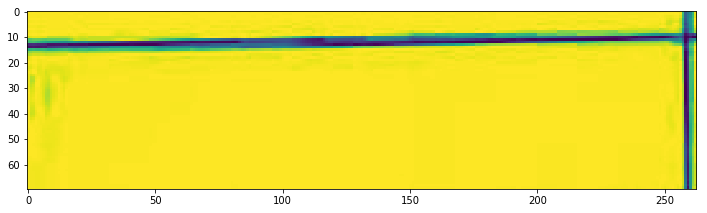

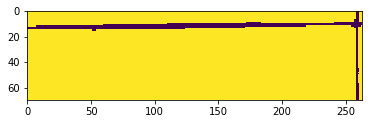

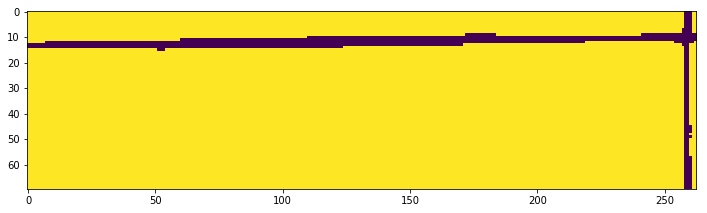

87395726
Numeric
Net_Premium


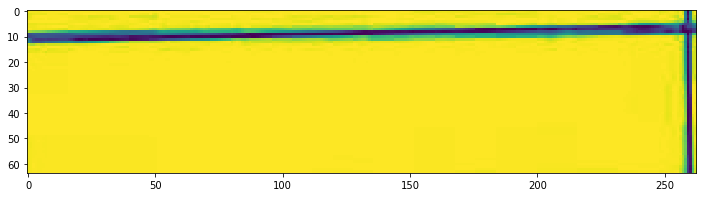

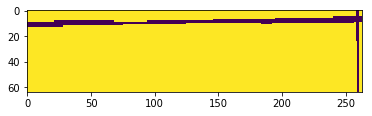

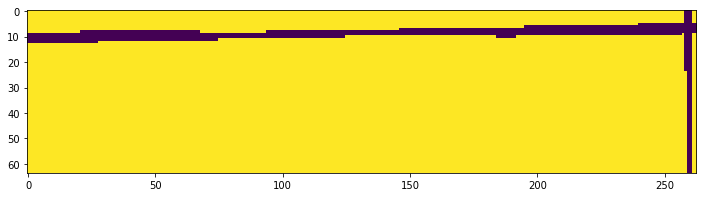

87395726
Numeric
Service_tax


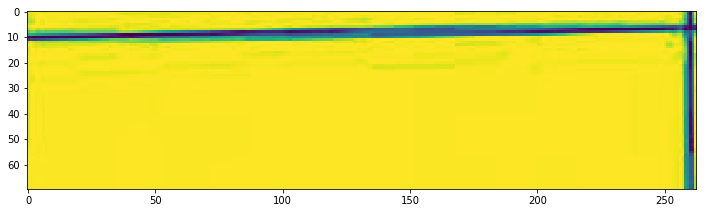

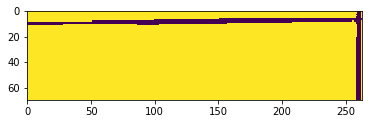

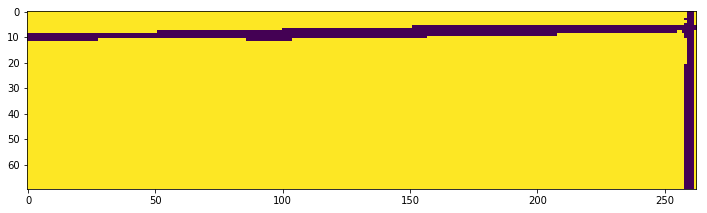

87395726
Numeric
Gross_Premium


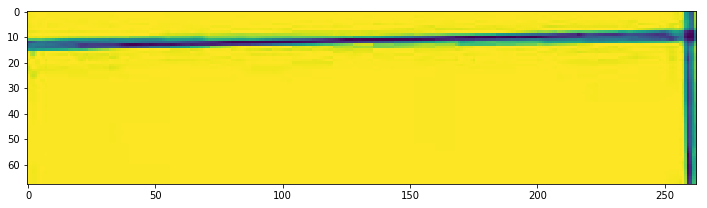

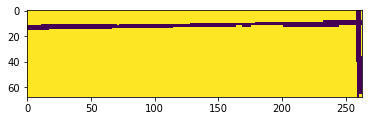

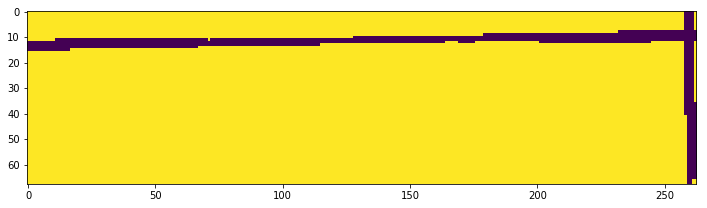

87395726
Numeric
Value of electrical accessories fitted in the vehicle


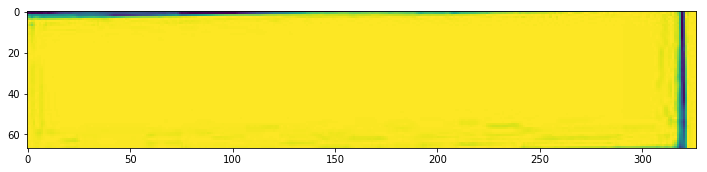

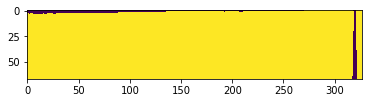

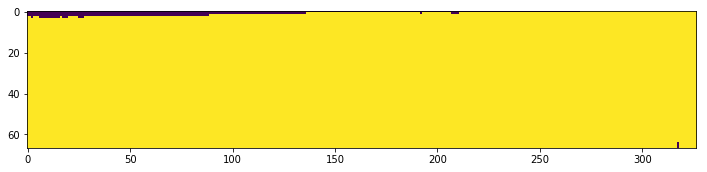

87395726
Numeric
Value of Non electrical accessories fitted to the vehicle


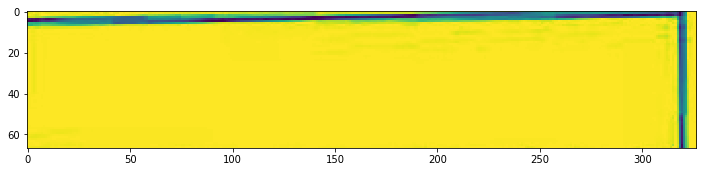

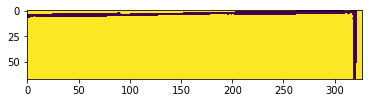

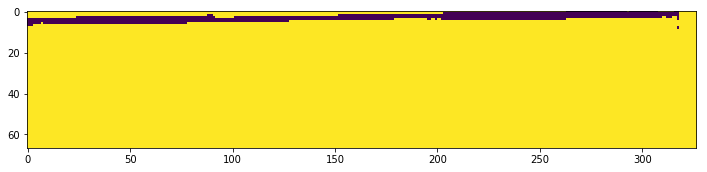

87395726
Numeric
Total IDV 


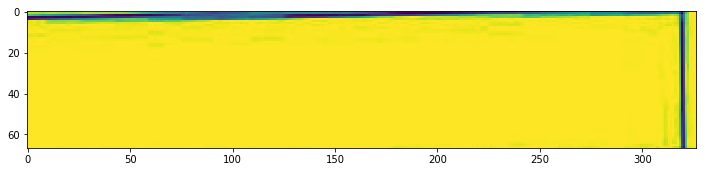

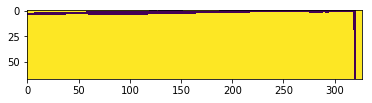

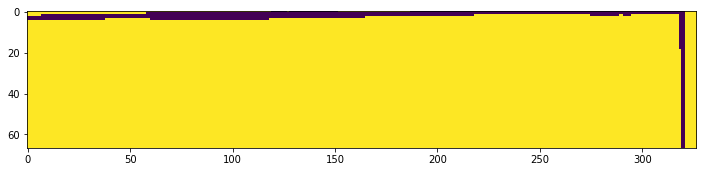

87395726
Numeric
Basic TP cover


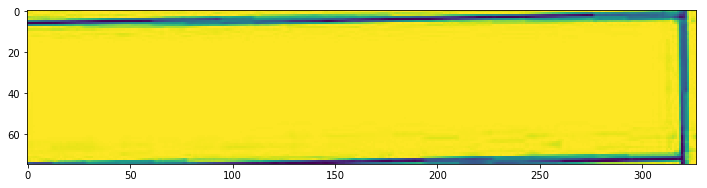

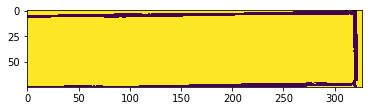

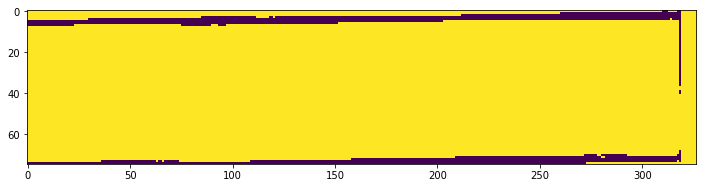

87395726
Numeric
TPPD Restriction 


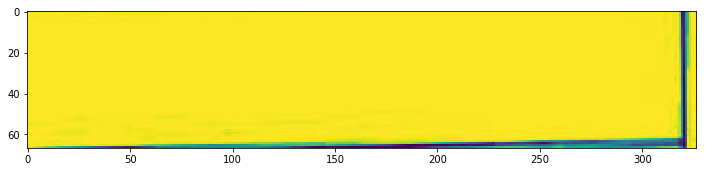

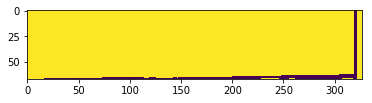

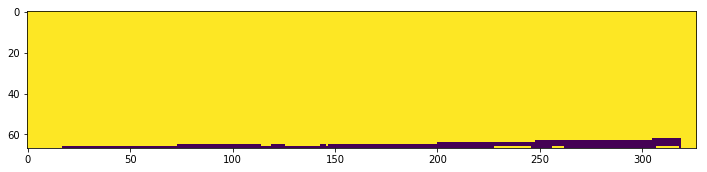

87395726
Numeric
CNG_LPG


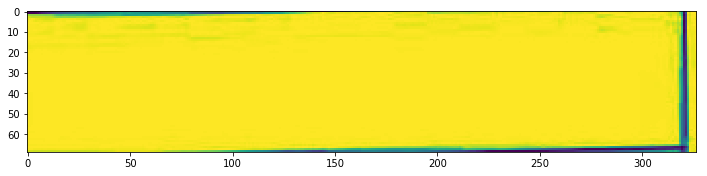

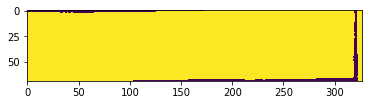

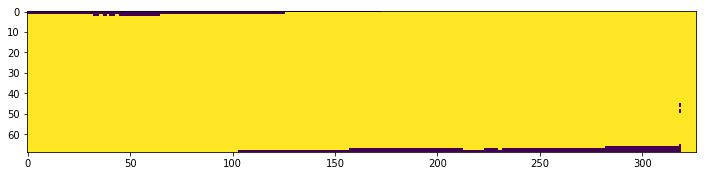

87395726
Numeric
PA for owner driver


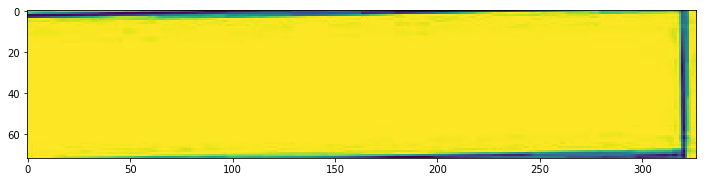

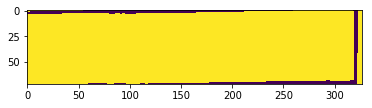

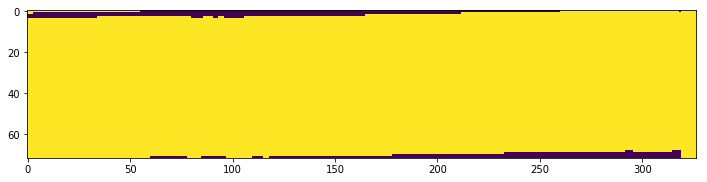

87395726
Numeric
Sum insured per person


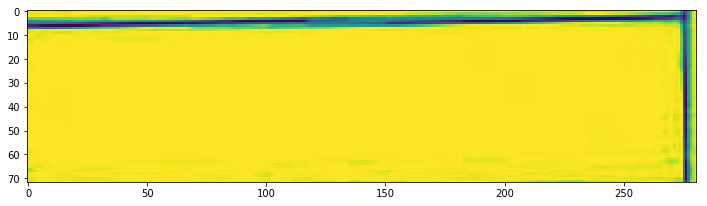

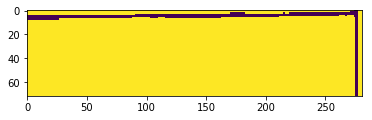

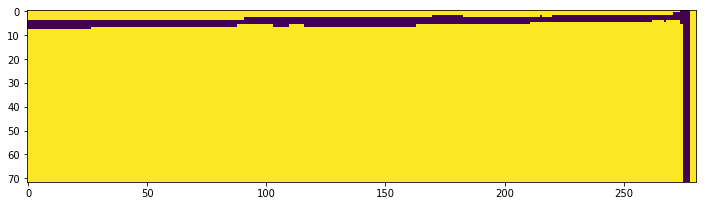

87395726
Numeric
Number of persons


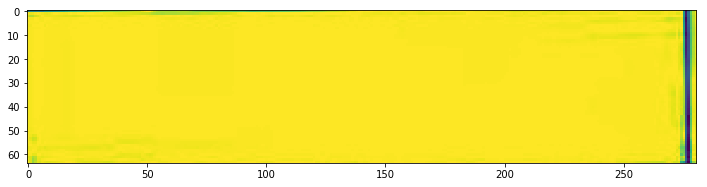

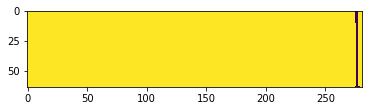

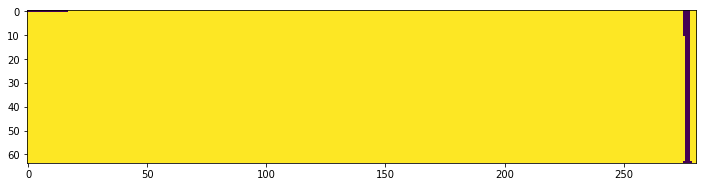

87395726
Numeric
PA for passengers Amount


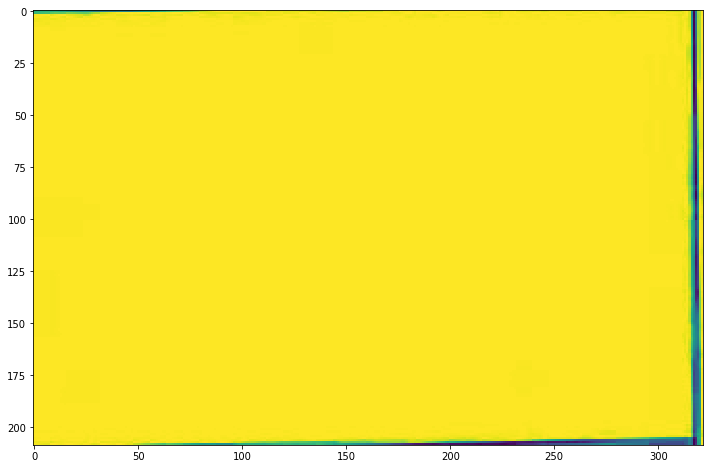

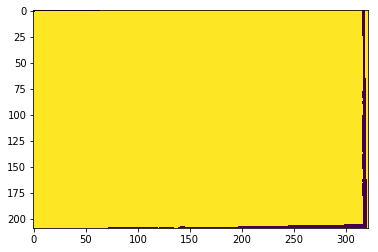

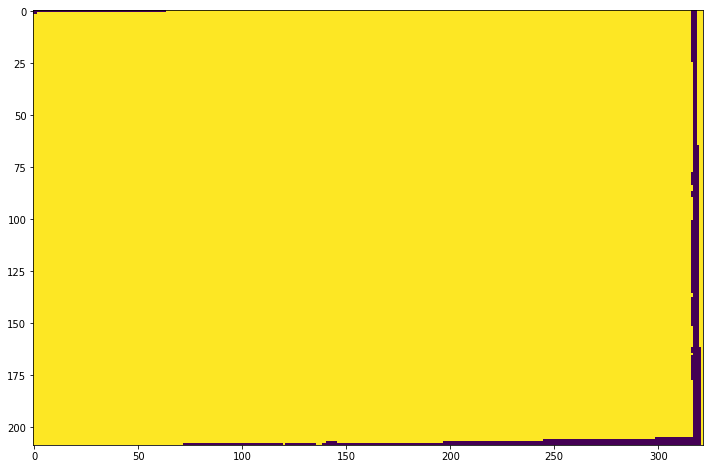

87395726
Numeric
Legal liability for paid driver


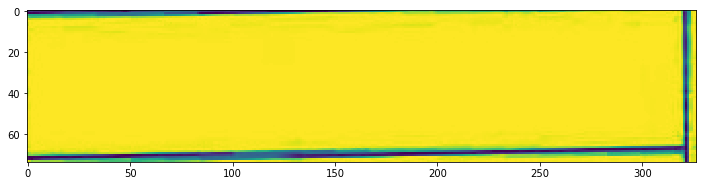

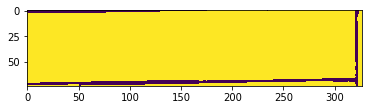

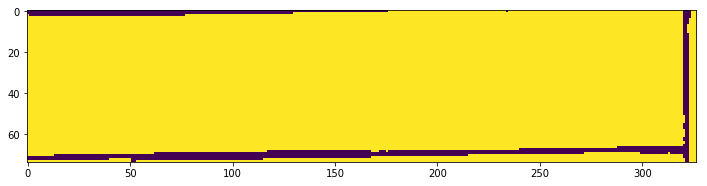

87395726
Numeric
Number of employees


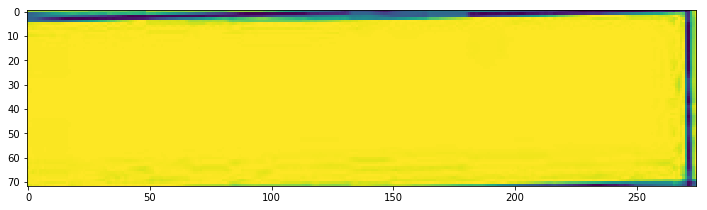

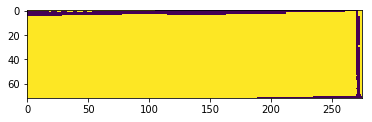

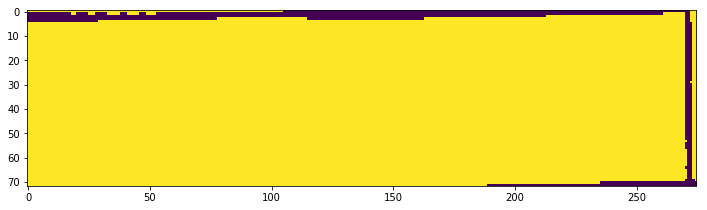

87395726
Numeric
Total_amount_liability


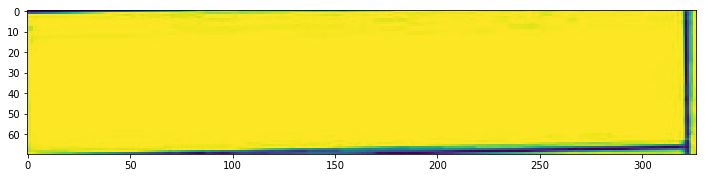

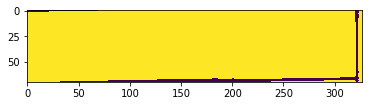

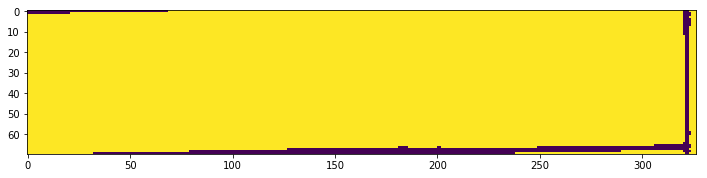

87395726
Numeric
Cheque Number


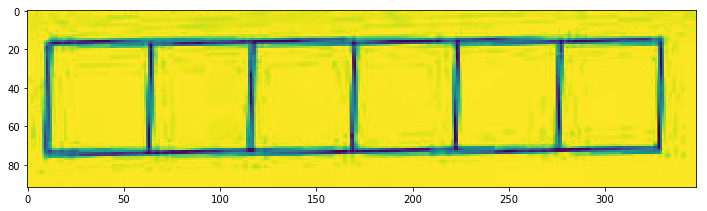

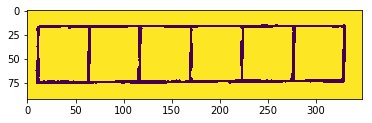

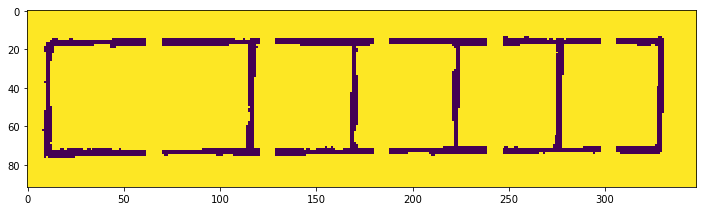

87395726
Numeric
Cheque Date


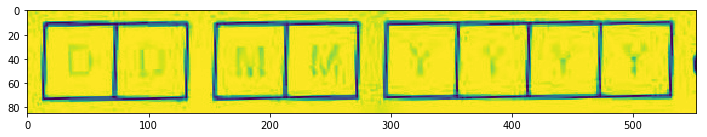

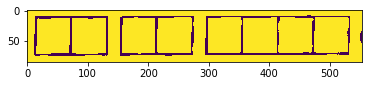

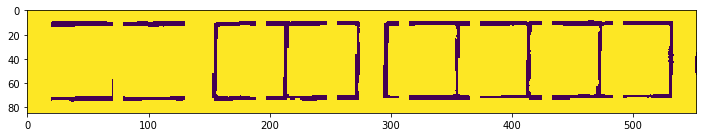

87395726
Numeric
Date


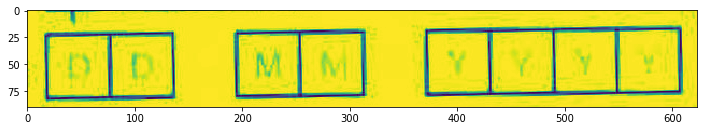

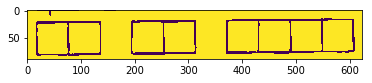

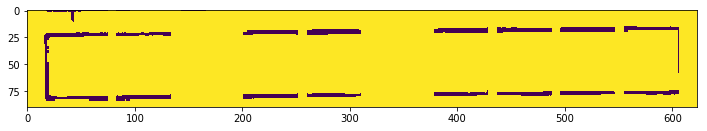

87395726
Character
IMD Name


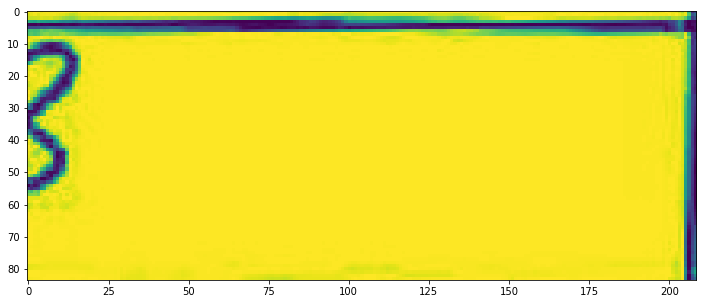

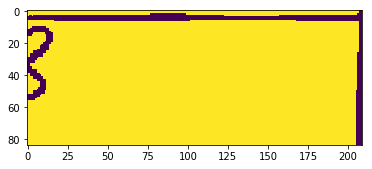

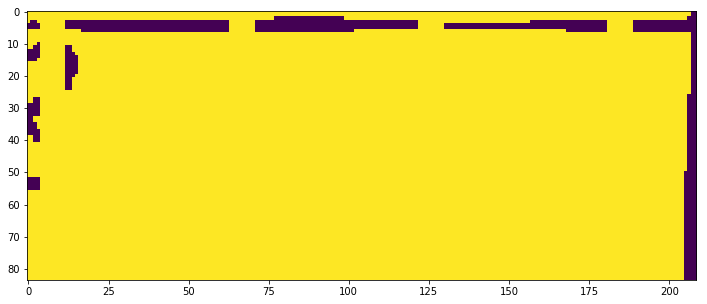

87395726
Character
Title


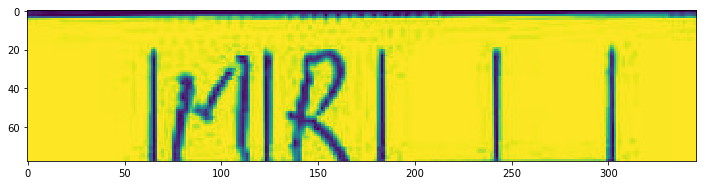

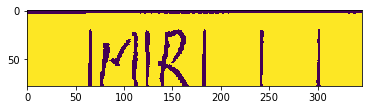

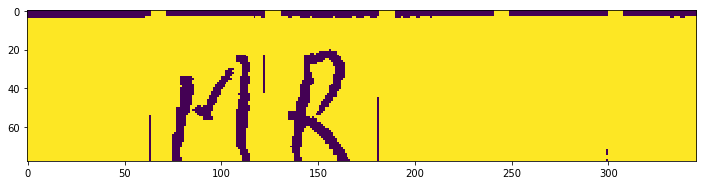

87395726
Character
First name


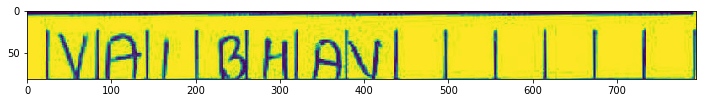

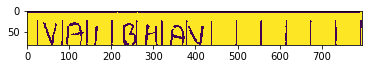

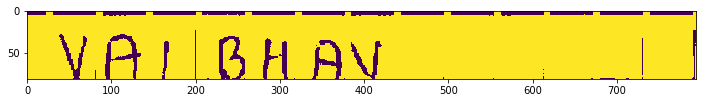

87395726
Character
Middle Name


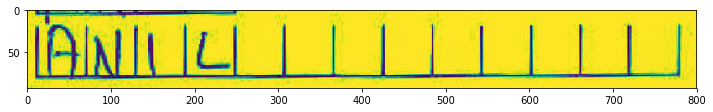

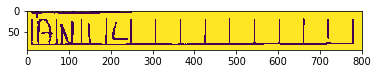

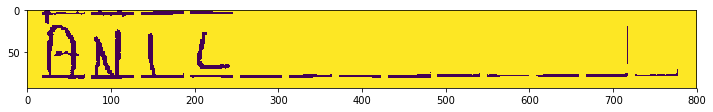

87395726
Character
Surname


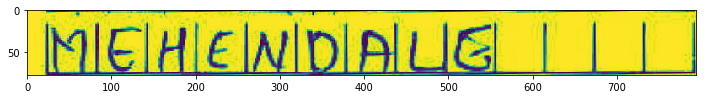

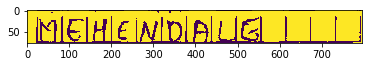

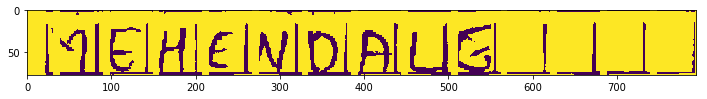

87395726
Character
Are you an existing Bajaj Allianz customer_Policy No


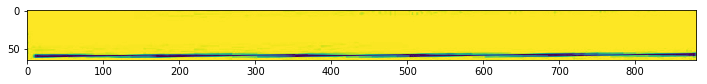

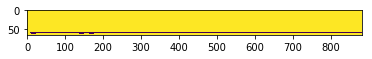

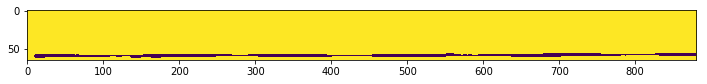

87395726
Character
City


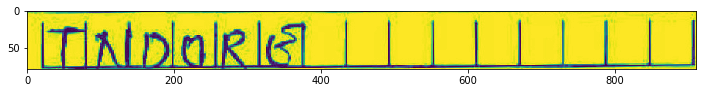

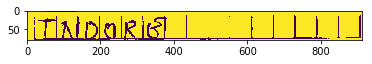

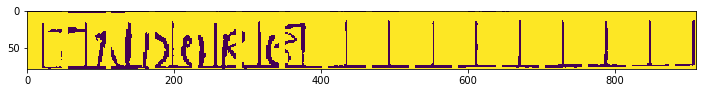

87395726
Character
State


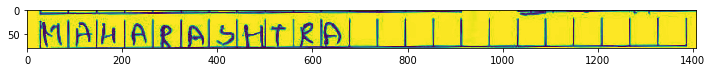

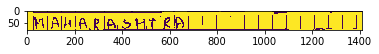

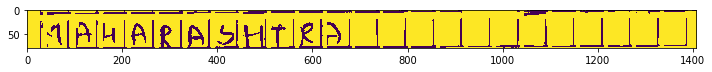

87395726
Character
Make


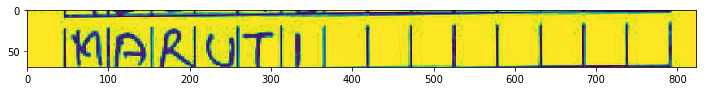

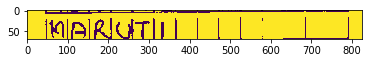

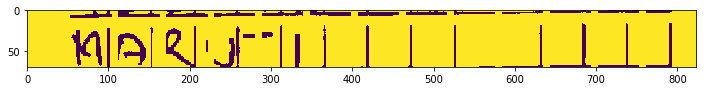

87395726
Character
Name Of Financial Institution


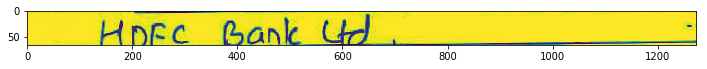

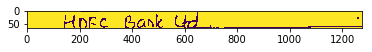

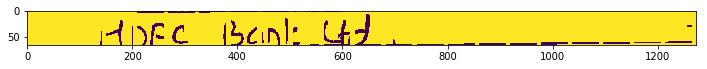

87395726
Character
Name of the Nominee


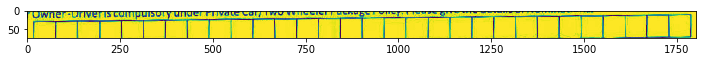

In [ ]:
for image_path in glob.glob(os.path.join('/KALpydev/new_Cropped/','*/*/*.jpg')):
    img = cv2.imread(image_path,0)

    if img is not None:
        aname=image_path.split('/')[3].split('.')[0]
        print(aname)
        bname=image_path.split('/')[4].split('.')[0]
        print(bname)
        fname=image_path.split('/')[5].split('.')[0]
        print(fname)
        plt.figure(figsize=(12,12));plt.imshow(img);plt.show()
        try:
            kernel = np.ones(df.loc[df['FieldName']=="'"+fname+"'"]['Dilation'], np.uint8)
    #             kernel = np.ones((4,3), np.uint8)
            overlay = cv2.dilate(img, kernel, iterations = 1)
            kernel1 = np.ones(df.loc[df['FieldName']=="'"+fname+"'"]['Erosion'], np.uint8)
    #             kernel1 = np.ones((4,3),np.uint8)
            overlay = cv2.erode(overlay,kernel1,iterations = 1)
        except:
            pass
        #cv2.imwrite("/home/Sandeep/something1.jpg", overlay)
        #overlay = cv2.threshold(img,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)[1]
        overlay = cv2.threshold(overlay,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)[1]
        #overlay = overlay[int(overlay.shape[0]*0.1):int(overlay.shape[0]*0.9),:]
        #cv2.imwrite('/home/Arjun/files/'+fname+'.jpg', overlay)
        #print(overlay.shape)
        plt.imshow(overlay);plt.show()
        a = []
        for i in range(overlay.shape[1]):
            try:
                if overlay[int(overlay.shape[0]*0.5),i]==0 and overlay[int(overlay.shape[0]*0.5),i+1]==0 and overlay[int(overlay.shape[0]*0.5),i+2]==0:
                    a.append(i)
            except IndexError:
                pass




        which = image_path.split('/')[4].split('.')[0]

        if len(a)!=0:
            if which == "Alpha Numeric":
                for each in np.arange(start=a[0], stop=overlay.shape[1],step=59):
                    try:
                        overlay[:,each:each+8] = np.ones((overlay.shape[0],8), dtype=int)*255
                    except :
                        continue
            else:
                for each in np.arange(start=a[0], stop=overlay.shape[1],step=59):
                    try:
                        overlay[:,each:each+8] = np.ones((overlay.shape[0],8), dtype=int)*255
                    except ValueError:
                        continue

        plt.figure(figsize=(12,12));plt.imshow(overlay);plt.show()

    #kernel = np.ones((3,1), np.uint8)
#         kernel = np.ones((2,5), np.uint8)
#         overlay = cv2.erode(overlay, kernel, iterations = 1)
    #kernel1 = np.ones((3,1),np.uint8)
    #kernel1 = np.ones((4,3),np.uint8)
    #overlay = cv2.erode(overlay,kernel1,iterations = 1)
    cv2.imwrite('/home/Sandeep'+aname+'-WithoutGrid/'+bname+'/'+fname+'.jpg', overlay)

    #print(a)

In [ ]:
for image_path in glob.glob(os.path.join('/KALpydev/new_Cropped/','*/*/*.jpg')):
    img = cv2.imread(image_path,0)

    if img is not None:
        aname=image_path.split('/')[3].split('.')[0]
        print(aname)
        bname=image_path.split('/')[4].split('.')[0]
        print(bname)
        fname=image_path.split('/')[5].split('.')[0]
        print(fname)
        plt.figure(figsize=(12,12));plt.imshow(img);plt.show()
        try:
            kernel = np.ones(df.loc[df['FieldName']=="'"+fname+"'"]['Dilation'], np.uint8)
    #             kernel = np.ones((4,3), np.uint8)
            overlay = cv2.dilate(img, kernel, iterations = 1)
            kernel1 = np.ones(df.loc[df['FieldName']=="'"+fname+"'"]['Erosion'], np.uint8)
    #             kernel1 = np.ones((4,3),np.uint8)
            overlay = cv2.erode(overlay,kernel1,iterations = 1)
        except:
            pass
        #cv2.imwrite("/home/Sandeep/something1.jpg", overlay)
        #overlay = cv2.threshold(img,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)[1]
        overlay = cv2.threshold(overlay,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)[1]
        #overlay = overlay[int(overlay.shape[0]*0.1):int(overlay.shape[0]*0.9),:]
        #cv2.imwrite('/home/Arjun/files/'+fname+'.jpg', overlay)
        #print(overlay.shape)
        plt.imshow(overlay);plt.show()
        a = []
        for i in range(overlay.shape[1]):
            try:
                if overlay[int(overlay.shape[0]*0.5),i]==0 and overlay[int(overlay.shape[0]*0.5),i+1]==0 and overlay[int(overlay.shape[0]*0.5),i+2]==0:
                    a.append(i)
            except IndexError:
                pass




        which = image_path.split('/')[4].split('.')[0]

        if len(a)!=0:
            if which == "Alpha Numeric":
                for i in df.loc[df['FieldName']==fname]['Step']:
                    for each in np.arange(start=a[0], stop=overlay.shape[1],step=i):
                        try:
                            for j in df.loc[df['FieldName']==fname]['GridWidth']:
                                overlay[:,each:each+j] = np.ones((overlay.shape[0],j), dtype=int)*255
                        except :
                            pass
            else:
                for i in df.loc[df['FieldName']==fname]['Step']:
                    for each in np.arange(start=a[0], stop=overlay.shape[1],step=i):
                        try:
                            for j in df.loc[df['FieldName']==fname]['GridWidth']:
                                overlay[:,each:each+j] = np.ones((overlay.shape[0],j), dtype=int)*255
                        except :
                            pass
        plt.figure(figsize=(12,12));plt.imshow(overlay);plt.show()

    #kernel = np.ones((3,1), np.uint8)
#         kernel = np.ones((2,5), np.uint8)
#         overlay = cv2.erode(overlay, kernel, iterations = 1)
    #kernel1 = np.ones((3,1),np.uint8)
    #kernel1 = np.ones((4,3),np.uint8)
    #overlay = cv2.erode(overlay,kernel1,iterations = 1)
    cv2.imwrite('/home/Sandeep'+aname+'-WithoutGrid/'+bname+'/'+fname+'.jpg', overlay)

    #print(a)

In [ ]:
for image_path in glob.glob(os.path.join('/KALpydev/new_Cropped/89643725/Alpha Numeric','Chasis Number.jpg')):
    img = cv2.imread(image_path,0)

    if img is not None:
        fname=image_path.split('/')[5].split('.')[0]
        print(fname)
        plt.figure(figsize=(12,12));plt.imshow(img);plt.show()
        kernel = np.ones((3,1), np.uint8)
        #kernel = np.ones((4,3), np.uint8)
        overlay = cv2.dilate(img, kernel, iterations = 1)
        kernel1 = np.ones((3,1),np.uint8)
        #kernel1 = np.ones((4,3),np.uint8)
        overlay = cv2.erode(overlay,kernel1,iterations = 1)
        
        #cv2.imwrite("/home/Sandeep/something1.jpg", overlay)
        #overlay = cv2.threshold(img,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)[1]
        overlay = cv2.threshold(overlay,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)[1]
        #overlay = overlay[int(overlay.shape[0]*0.1):int(overlay.shape[0]*0.9),:]
        #cv2.imwrite('/home/Arjun/files/'+fname+'.jpg', overlay)
        #print(overlay.shape)
        plt.imshow(overlay);plt.show()
        cv2.imwrite('/home/Sandeep/something1.jpg', overlay)
        a = []
        for i in range(overlay.shape[1]):
            try:
                if overlay[int(overlay.shape[0]*0.5),i]==0 and overlay[int(overlay.shape[0]*0.5),i+1]==0: #and overlay[int(overlay.shape[0]*0.5),i+2]==0:
                    a.append(i)
            except IndexError:
                pass



#         if fname in list(df['FieldName']):
#             grid_width=int(df.loc[(df.FieldName == fname) , ['GridWidth']]['GridWidth'])
#             grid_height=int(df.loc[(df.FieldName == fname) , ['GridHeight']]['GridHeight'])
#             no_gridlines=int(df.loc[(df.FieldName == fname) , ['Noofgridlines']]['Noofgridlines'])

        which = image_path.split('/')[4].split('.')[0]
        print(which)

        if len(a)!=0:
            if which == "Alpha Numeric":
                for each in np.arange(start=a[0], stop=overlay.shape[1],step=53):
                    try:
                        overlay[:,each:each+10] = np.ones((overlay.shape[0],10), dtype=int)*255
                    except :
                        pass
            else:
                for each in np.arange(start=a[0], stop=overlay.shape[1],step=59):
                    try:
                        overlay[:,each:each+8] = np.ones((overlay.shape[0],8), dtype=int)*255
                    except ValueError:
                        pass

        #closing = cv2.morphologyEx(overlay, cv2.MORPH_CLOSE, kernel)
        plt.figure(figsize=(12,12));plt.imshow(overlay);plt.show()

    #kernel = np.ones((3,1), np.uint8)
#         kernel = np.ones((2,5), np.uint8)
#         overlay = cv2.erode(overlay, kernel, iterations = 1)
    #kernel1 = np.ones((3,1),np.uint8)
    #kernel1 = np.ones((4,3),np.uint8)
    #overlay = cv2.erode(overlay,kernel1,iterations = 1)
    
    cv2.imwrite('/home/Sandeep/city.jpg', overlay)

    print(a)

In [ ]:
character_extraction('/home/Sandeep/something1.jpg', dico, model_char)

In [ ]:
# Numeric Extraction
def numeric_extraction(numeric_file, dico, model_numm):
    im = cv2.imread(numeric_file,0)
    if im is not None:
        im1=im.copy()
        ref = cv2.threshold(im1, 0, 255, cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)[1]
        mask = np.zeros_like(ref)
        w = ref.shape[1]
        shp = round(w * 0.15)
        if shp % 2 == 0:
            shp = shp + 1
        kr = cv2.getStructuringElement(cv2.MORPH_RECT,(shp,1))
        er = cv2.erode(ref, kr, 1)
        kr = cv2.getStructuringElement(cv2.MORPH_RECT,(shp,1))
        dl = cv2.dilate(er, kr, 1)
        OriImg2 = im.copy()
        img = dl
        OrimgCopy = dl
        added= cv2.add(cv2.bitwise_not(ref), dl)
        (_, cnts, _) = cv2.findContours(cv2.bitwise_not(added).copy(), cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
        cnts1 = [c for c in cnts if cv2.contourArea(c) < round(w*0.1)]    
        for c in cnts1:
            cv2.drawContours(mask, [c], -1, 255, 2)
        img_output = cv2.bitwise_not(cv2.add(added, mask))
        img,ctrs,hier = cv2.findContours(img_output.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        areas = [cv2.contourArea(ctr) for ctr in ctrs]
        mean = np.mean(areas)
        x = 0
        i = []
        cv2.imwrite('/home/New folder/image.jpg',img)
        for area in areas:
            if area < (0.50 * mean):
                i.extend([x])
                x=x+1
            else:
                x=x+1
        rects = [cv2.boundingRect(ctr) for ctr in ctrs]
    #         print("rects", rects)
        rect2 = np.array(rects, 'int')
    #         print("rect2", rect2.shape)
        col = 0
        try:
            rect2 = rect2[np.argsort(rect2[:,col])]
        except IndexError:
            rect2 = rects
        li = []
        s=""
        O_copy = OriImg2.copy()
        d={}
        cnt = 0
        cv2.imwrite('/home/New folder/image1.jpg',O_copy)
        for j,rect in enumerate(rect2):
            newImg = cv2.rectangle(O_copy, (rect[0], rect[1]), (rect[0] + rect[2], rect[1] + rect[3]), (0, 255, 0), 3)
    #             newImg2 = cv2.bitwise_not(newImg1)
            leng = int(rect[3] * 1.05)
            pt1 = int(rect[1] + rect[3] // 2 - leng // 2)
            pt2 = int(rect[0] + rect[2] // 2 - leng // 2)
            roi = OriImg2[pt1:pt1+leng, pt2:pt2+leng]
    #             print('ROI')
    #             plt.imshow(roi)
    #             plt.show()
            a_str=''
            if roi.shape[0] >= 28 and roi.shape[1] >= 28:
                roi = cv2.resize(roi, (28, 28), cv2.INTER_AREA)

    #                 print('ROI-After Resizing')
    #                 plt.imshow(roi)
    #                 plt.show()
                ret1, im_th1 = cv2.threshold(roi, 190, 255, cv2.THRESH_BINARY)
    #                 print('ROI-After Thresholding')
    #                 plt.imshow(im_th1)
    #                 plt.show()
                img = im_th1.astype('float32')
                img = img/255
                img = img.reshape((1,28,28,1))
                a_str = model_numm.predict_classes(img)
    #                 print('Prediction')
    #                 print(a_str)
    #                 print('\n#############\n') 
            s+=str(a_str)
        s=s.replaceEO12121('[','').replace(']','')
    #         print(s)
        return s
    

In [ ]:
def ones_padding(x):
    y=np.ones([32,32])
    y[2:30,2:30]=x
    return(y)

In [ ]:
def character_extraction(character_file, dico, model_char):
    im = cv2.imread(character_file,0)
    if im is not None:
        im1=im.copy()
        print('im1',im1)
        ref = cv2.threshold(im1, 0, 255, cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)[1]
        print('ref',ref)
        mask = np.zeros_like(ref)
        print('mask',mask)
        w = ref.shape[1]
        shp = round(w * 0.15)
        
        if shp % 2 == 0:
            
            shp = shp + 1

        kr = cv2.getStructuringElement(cv2.MORPH_RECT,(shp,1))
        er = cv2.erode(ref, kr, 1)
        kr = cv2.getStructuringElement(cv2.MORPH_RECT,(shp,1))
        dl = cv2.dilate(er, kr, 1)
        OriImg2 = im.copy()
        img = dl
        OrimgCopy = dl
        added= cv2.add(cv2.bitwise_not(ref), dl)
        #Image.fromarray(added)

        (_, cnts, _) = cv2.findContours(cv2.bitwise_not(added).copy(), cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
        
        cnts1 = [c for c in cnts if cv2.contourArea(c) < round(w*0.1)]    
        for c in cnts1:
            cv2.drawContours(mask, [c], -1, 255, 2)

        img_output = cv2.bitwise_not(cv2.add(added, mask))
        #img_output = np.apply_along_axis(check, 0, img_output)

#         plt.imshow(cv2.bitwise_not(cv2.add(added, mask)))
#         plt.show()

        ####### Try grid removal logic here ######
#         if num[2] == 'Y':
# #             print("it has grids")
#             out_image_char = grid_removal(img_output.copy())
#         else:
# #             print("it does not have grids")
#             out_image_char = img_output
            
# #         print("YEEEEE")
#         plt.imshow(out_image_char)
#         plt.show()
        
        img,ctrs,hier = cv2.findContours(img_output.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        #print()
        areas = [cv2.contourArea(ctr) for ctr in ctrs]
        mean = np.mean(areas)
        x = 0
        i = []
        cv2.imwrite('/home/New folder/image.jpg',img)
        for area in areas:
            if area < (0.50 * mean):
                i.extend([x])
                x=x+1
            else:
                x=x+1
        rects = [cv2.boundingRect(ctr) for ctr in ctrs]
#         print("rects", rects)
        rect2 = np.array(rects, 'int')
#         print("rect2", rect2.shape)
        col = 0
        try:
            rect2 = rect2[np.argsort(rect2[:,col])]
        except IndexError:
            rect2 = rects
        li = []
        s=""
#         plt.imshow(rect2)
#         plt.show()
        O_copy = OriImg2.copy()
        d={}
        cnt = 0
        cv2.imwrite('/home/New folder/image1.jpg',O_copy)
        for j,rect in enumerate(rect2):
            newImg = cv2.rectangle(O_copy, (rect[0], rect[1]), (rect[0] + rect[2], rect[1] + rect[3]), (0, 255, 0), 3)
            newImg2 = cv2.bitwise_not(newImg) 
            plt.imshow(newImg);plt.show()
            leng = int(rect[3] * 1.05)
            pt1 = int(rect[1] + rect[3] // 2 - leng // 2)
            pt2 = int(rect[0] + rect[2] // 2 - leng // 2)
            roi = OriImg2[pt1:pt1+leng, pt2:pt2+leng]
            plt.imshow(roi)
            plt.show()
            a_str=''
            if roi.shape[0] >= 24 and roi.shape[1] >= 24:
                roi = cv2.resize(roi, (28, 28), cv2.INTER_AREA)
#                 plt.imshow(roi)
#                 plt.show()
                ret1, im_th1 = cv2.threshold(roi, 190, 255, cv2.THRESH_BINARY)
                img = im_th1.astype('float32')
                img = resize(img, (28,28), order=1, preserve_range=True)
                img = img/255
                img = resize(ones_padding(img), (28,28), order=1, preserve_range=True)
                img = img.reshape((1,28,28,1))

                a_str = model_char.predict_classes(img)
#                 print(a_str[0])
                a_str = string.ascii_uppercase[a_str[0]]
                print(a_str)
                d[cnt] = rect[0]
                cnt=cnt+1
#             print('d', d)
            s += str(a_str)
        x = list(d.values())
        if (len(x)>=3):
            y=[x[i+1]-x[i] for i in range(len(x)-1)]
            s1 = s[0:(np.argmax(y)+1)]+' '+s[(np.argmax(y)+1):]    
        else:
            s1 = s
        return s1

In [ ]:
def alphanumeric_extraction(character_file, dico, model_alphanum):
    im = cv2.imread(character_file,0)
    if im is not None:
        im1=im.copy()
        ref = cv2.threshold(im1, 0, 255, cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)[1]
        mask = np.zeros_like(ref)
        w = ref.shape[1]
        shp = round(w * 0.15)
        if shp % 2 == 0:
            
            shp = shp + 1

        kr = cv2.getStructuringElement(cv2.MORPH_RECT,(shp,1))
        er = cv2.erode(ref, kr, 1)
        kr = cv2.getStructuringElement(cv2.MORPH_RECT,(shp,1))
        dl = cv2.dilate(er, kr, 1)
        OriImg2 = im.copy()
        img = dl
        OrimgCopy = dl
        added= cv2.add(cv2.bitwise_not(ref), dl)
        #Image.fromarray(added)

        (_, cnts, _) = cv2.findContours(cv2.bitwise_not(added).copy(), cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
        
        cnts1 = [c for c in cnts if cv2.contourArea(c) < round(w*0.1)]    
        for c in cnts1:
            cv2.drawContours(mask, [c], -1, 255, 2)

        img_output = cv2.bitwise_not(cv2.add(added, mask))
        #img_output = np.apply_along_axis(check, 0, img_output)

#         plt.imshow(cv2.bitwise_not(cv2.add(added, mask)))
#         plt.show()

        ####### Try grid removal logic here ######
#         if num[2] == 'Y':
# #             print("it has grids")
#             out_image_alpha = grid_removal(img_output)
#         else:
# #             print("it has no grids")
#             out_image_alpha = img_output        
        
# #         plt.imshow(out_image_alpha)
# #         plt.show()
        
        img,ctrs,hier = cv2.findContours(img_output.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        areas = [cv2.contourArea(ctr) for ctr in ctrs]
        mean = np.mean(areas)
        x = 0
        i = []
        cv2.imwrite('/home/New folder/image.jpg',img)
        for area in areas:
            if area < (0.50 * mean):
                i.extend([x])
                x=x+1
            else:
                x=x+1
        rects = [cv2.boundingRect(ctr) for ctr in ctrs]
        rect2 = np.array(rects, 'int')
#         print(rect2.shape)
        col = 0
        try:
            rect2 = rect2[np.argsort(rect2[:,col])]
        except IndexError:
            rect2 = rects
        li = []
        s=""
        
#         plt.imshow(rect2)
#         plt.show()
        
        O_copy = OriImg2.copy()
        d={}
        cnt = 0
        cv2.imwrite('/home/New folder/image1.jpg',O_copy)
        for j,rect in enumerate(rect2):
            newImg = cv2.rectangle(O_copy, (rect[0], rect[1]), (rect[0] + rect[2], rect[1] + rect[3]), (0, 255, 0), 3)
#             newImg2 = cv2.bitwise_not(newImg1) 
            leng = int(rect[3] * 1.05)
            pt1 = int(rect[1] + rect[3] // 2 - leng // 2)
            pt2 = int(rect[0] + rect[2] // 2 - leng // 2)
            roi = OriImg2[pt1:pt1+leng, pt2:pt2+leng]

#             print('ROI')
#             plt.imshow(roi)
#             plt.show()
            a_str=''
            if roi.shape[0] >= 28 and roi.shape[1] >= 28:
                
#                 roi = cv2.cvtColor(roi, cv2.COLOR_BGR2GRAY)
                roi = cv2.resize(roi,(28,28))
                roi = np.array(roi)
                roi = roi.astype('float32')
                roi /= 255
                        #print (test_image.shape)
                roi = np.expand_dims(roi, axis=0)
                img = np.expand_dims(roi, axis=0)
                
#                 roi = cv2.resize(roi, (28, 28), cv2.INTER_AREA)

# #                 print('ROI-After Resizing')
# #                 plt.imshow(roi)
# #                 plt.show()
# #                     ret1, im_th1 = cv2.threshold(roi, 127, 255, cv2.THRESH_BINARY_INV)
#                 img = im_th1.astype('float32')
#                 img = 255-img
#                 img = img/255
#                 img = img.reshape((1,1,28,28))

                a_str = model_alphanum.predict_classes(img)
                a_str = str(decode_class(a_str))
#                 print(a_str[0])
                #a_str = string.ascii_uppercase[a_str[0]]
            s += str(a_str)
        #print(s, decode_class(s))
        return s

In [ ]:
def decode_class(s):
    if s in [i for i in range(10)]:
        return(str(s[0]))
    elif s==10:
        return('A')
    elif s==11:
        return('@')
    elif s==12:
        return('B')
    elif s==13:
        return('C')
    elif s==14:
        return('D')
    elif s==15:
        return('E')
    elif s==16:
        return('F')
    elif s==17:
        return('G')
    elif s==18:
        return('H')
    elif s==19:
        return('I')
    elif s==20:
        return('J')
    elif s==21:
        return('K')
    elif s==22:
        return('L')
    elif s==23:
        return('M')
    elif s==24:
        return('N')
    elif s==25:
        return('O')
    elif s==26:
        return('P')
    elif s==27:
        return('Q')
    elif s==28:
        return('R')
    elif s==29:
        return('Rs.')
    elif s==30:
        return('S')
    elif s==31:
        return('T')
    elif s==32:
        return('U')
    elif s==33:
        return('V')
    elif s==34:
        return('W')
    elif s==35:
        return('X')
    elif s==36:
        return('Y')
    elif s==37:
        return('Z')

In [ ]:
json_file = open('/KALpydev/icr_pickle_files/CNN_Model/model_alpha9.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
model_alphanum = model_from_json(loaded_model_json)
model_alphanum.load_weights("/KALpydev/icr_pickle_files/CNN_Model/model_alpha9.h5")

In [ ]:
alphanumeric_extraction('/home/Sandeep/city.jpg', dico, model_alphanum)

In [ ]:
numeric_extraction('/home/Sandeep/something1.jpg',dico,model_numm)

In [ ]:
character_extraction('/home/Sandeep/something1.jpg', dico, model_char)

In [ ]:
with open("/KALpydev/icr_pickle_files/dictionary.p","rb") as f: 
        V, dico = pickle.load(f, encoding='latin1')